In [10]:
ROOT = '/home/yuli_zeira/Cognatehood/'
ENG = 'eng'
SPA = 'spa'

In [11]:
BI_INSERTION_0 = ROOT + 'char_weights/alphabet/new/insertion_0'
BI_DELETION_0 = ROOT + 'char_weights/alphabet/new/deletion_0'
BI_SUBSTITUTION_0 = ROOT + 'char_weights/alphabet/new/substitution_0'

BI_INSERTION_1 = ROOT + 'char_weights/alphabet/new/insertion_1'
BI_DELETION_1 = ROOT + 'char_weights/alphabet/new/deletion_1'
BI_SUBSTITUTION_1 = ROOT + 'char_weights/alphabet/new/substitution_1'

TRI_INSERTION = ROOT + 'char_weights/alphabet/new/insertion_tri'
TRI_DELETION = ROOT + 'char_weights/alphabet/new/deletion_tri'
TRI_SUBSTITUTION = ROOT + 'char_weights/alphabet/new/substitution_tri'

IPA_BI_INSERTION_0 = ROOT + 'char_weights/ipa/new/ipa_insertion_0'
IPA_BI_DELETION_0 = ROOT + 'char_weights/ipa/new/ipa_deletion_0'
IPA_BI_SUBSTITUTION_0 = ROOT + 'char_weights/ipa/new/ipa_substitution_0'

IPA_BI_INSERTION_1 = ROOT + 'char_weights/ipa/new/ipa_insertion_1'
IPA_BI_DELETION_1 = ROOT + 'char_weights/ipa/new/ipa_deletion_1'
IPA_BI_SUBSTITUTION_1 = ROOT + 'char_weights/ipa/new/ipa_substitution_1'

IPA_TRI_INSERTION = ROOT + 'char_weights/ipa/new/ipa_insertion_tri'
IPA_TRI_DELETION = ROOT + 'char_weights/ipa/new/ipa_deletion_tri'
IPA_TRI_SUBSTITUTION = ROOT + 'char_weights/ipa/new/ipa_substitution_tri'

In [2]:
from numpy import dot
from numpy.linalg import norm
import numpy
import json
from os import listdir


class SimilarityMeasure:

    def __init__(self, en_vecs_path: str, es_vecs_path: str, en_words: str, es_words: str):
        self._en_words, self._en_vecs, self._en_words_rev = self.load_vectors(en_vecs_path)
        self._es_words, self._es_vecs, self._es_words_rev = self.load_vectors(es_vecs_path)
#         self._cos_sim = lambda a, b: ((dot(a, b) /  (norm(a) * norm(b))) + 1) * 0.5
        self._cos_sim = lambda a, b: dot(a, b) / (norm(a) * norm(b))
        self._en_lemmas_corpus, self._es_lemmas_corpus = self.load_words(en_words, es_words)
        self._en_similarities, self._es_similarities = dict(), dict()

    @staticmethod
    def load_vectors(path: str):
        words, vectors, words_rev = dict(), list(), dict()
        with open(path, 'r') as f:
            for i, line in enumerate(f):
                line = line.split()
                word = line[0]
                words[word] = i
                words_rev[i] = word
                vectors.append(line[1:])
                if i % 50000 == 0:
                    print(i)
#                 if i == 200000:
#                     break
        print('Done!')
        return words, numpy.array(vectors, dtype=float), words_rev
    
    def load_words(self, en_words: str, es_words: str):
        en_lemmas_corpus, es_lemmas_corpus = list(), list()
        with open(en_words, 'r') as f:
            for line in f.readlines():
                en_lemmas_corpus.append(line[:-1].lower())
        with open(es_words, 'r') as f:
            for line in f.readlines():
                es_lemmas_corpus.append(line[:-1].lower())
        print('Done loading words!')
        return en_lemmas_corpus, es_lemmas_corpus
    
    def get_similarities(self, word: str, lang: str, filename: str):
        similarities = dict()
        if lang == 'eng':
            try:
                word_ind = self._en_words[word]
                word_vec = self._en_vecs[word_ind]
            except KeyError:
                  print(f'No representation for {word} ({lang})')
                  return
            for ind in self._es_words_rev.keys():
                similarities[self._es_words_rev[ind]] = [self._cos_sim(word_vec, self._es_vecs[ind]), 0.0]
                # self._en_similarities[word][self._es_words_rev[ind]] = self._cos_sim(word_vec, self._es_vecs[ind])
        else:
            try:
                word_ind = self._es_words[word]
                word_vec = self._es_vecs[word_ind]
            except KeyError:
                  print(f'No representation for {word} ({lang})')
                  return
            for ind in self._en_words_rev.keys():
                similarities[self._en_words_rev[ind]] = [self._cos_sim(word_vec, self._en_vecs[ind]), 0.0]
                # self._es_similarities[word][self._en_words_rev[ind]] = self._cos_sim(word_vec, self._en_vecs[ind])
        with open(filename, 'w') as f:
            json.dump(similarities, f)
    
    def get_all_similarities(self, en_output: str, es_output: str):
        print(len(listdir(en_output)), len(listdir(es_output)))
        en_words = [w for w in self._en_lemmas_corpus if w + '.json' not in listdir(en_output)]
        es_words = [w for w in self._es_lemmas_corpus if w + '.json' not in listdir(es_output)]
        a, b = 0, 0
        for word in en_words:
            self.get_similarities(word, 'eng', en_output + word + '.json')
        for word in es_words:
            self.get_similarities(word, 'spa', es_output + word + '.json')
    
    def test_sim(self, word_en: str, word_es: str) -> float:
        word_vec_en = self._en_vecs[self._en_words[word_en]]
        word_vec_es = self._es_vecs[self._es_words[word_es]]        
        return self._cos_sim(word_vec_en, word_vec_es)

In [4]:
sm = SimilarityMeasure(ROOT + 'embeddings/final_en_vecs.vec',
                       ROOT + 'embeddings/final_es_vecs.vec',
                       ROOT + 'word_files/bm_lemmas_en.txt',
                       ROOT + 'word_files/bm_lemmas_es.txt')

0
50000
Done!
0
50000
Done!
Done loading words!


0.489101726916978


In [10]:
sm.get_all_similarities(ROOT + 'measures/en_lemmas/', ROOT + 'measures/es_lemmas/')

4281 2666
No representation for camping (eng)
No representation for cooling (eng)
No representation for o'clock (eng)
No representation for finding (eng)
No representation for hiring (eng)
No representation for misspent (eng)
No representation for r_n (eng)
No representation for being (eng)
No representation for uhhuh (eng)
No representation for planning (eng)
No representation for cleaning (eng)
No representation for c_d (eng)
No representation for starting (eng)
No representation for costumise (eng)
No representation for homeopath (eng)
No representation for cooking (eng)
No representation for periodo (eng)
No representation for am (eng)
No representation for haemorrhoid (eng)
No representation for reading (eng)
No representation for stevia (eng)
No representation for ayurdevic (eng)
No representation for u_f_o (eng)
No representation for decapitate (eng)
No representation for counting (eng)
No representation for walking (eng)
No representation for sit-up (eng)
No representation for 

In [12]:
import pickle


class FormMeasure:

    def __init__(self, insertion, deletion, substitution, ind: int, ipa=False):
        self._is_ipa = ipa
        self._ind = ind
        self._insertion = self.unpickle_weights(insertion)
        self._deletion = self.unpickle_weights(deletion)
        self._substitution = self.unpickle_weights(substitution)
        self.make_n_gram = [self.make_n_gram_first, self.make_n_gram_second,
                            self.make_trigram][ind]

    @staticmethod
    def unpickle_weights(weight_file):
        with open(weight_file, 'rb') as f:
            weight_dict = pickle.load(f)
        for w in weight_dict.keys():
            if weight_dict[w] > 1:
                print(weight_file, w, weight_dict[w])
        return weight_dict

    def make_n_gram_first(self, word, k: int) -> tuple[str]:
        if self._is_ipa:
            tup = [''] + word
        else:
            tup = [''] + list(word)
        new_tup = tup[k: k + 2]
        return tuple(new_tup)

    def make_n_gram_second(self, word, k: int) -> tuple[str]:
        if self._is_ipa:
            tup = word + ['']
        else:
            tup = list(word) + ['']
        new_tup = tup[k: k + 2]
        return tuple(new_tup)

    def make_trigram(self, word, k: int) -> tuple[str]:
        if self._is_ipa:
            tup = [''] + word + ['']
        else:
            tup = [''] + list(word) + ['']
        new_tup = tup[k: k + 3]
        return tuple(new_tup)

    def operations(self, ngram_1, ngram_2):
        if self._ind == 2:
            if ngram_1 in self._deletion.keys():
                delete = self._deletion[ngram_1]
            else:
                delete = 1.0
            if ngram_2 in self._insertion.keys():
                insert = self._insertion[ngram_2]
            else:
                insert = 1.0
            if (ngram_1, ngram_2) in self._substitution.keys():
                substitute = self._substitution[(ngram_1, ngram_2)]
            else:
                substitute = 1.0
        else:
            delete = self._deletion[ngram_1]
            insert = self._insertion[ngram_2]
            substitute = self._substitution[(ngram_1, ngram_2)]
        return delete, insert, substitute
    
    def initialize(self, word_1: str, word_2: str) -> tuple[dict, dict]:
        # Set up:
        distances = {(-1, -1): 0}
        # Initialize the arrays:
        for i in range(len(word_1)):
            w1_ngram = self.make_n_gram(word_1, i)
            if self._ind == 2 and w1_ngram not in self._deletion.keys():
                distances[(i, -1)] = 1.0 + distances[(i - 1, -1)]
            else:
                distances[(i, -1)] = self._deletion[w1_ngram] + distances[(i - 1, -1)]
        for j in range(len(word_2)):
            w2_ngram = self.make_n_gram(word_2, j)
            if self._ind == 2 and w2_ngram not in self._insertion.keys():
                distances[(-1, j)] = 1.0 + distances[(-1, j - 1)]
            else:
                distances[(-1, j)] = self._insertion[w2_ngram] + distances[(-1, j - 1)]
        return distances

    def edit_distance(self, word_1: str, word_2: str) -> tuple[float, float, float]:
        # Set up:
        if not self._is_ipa:
            word_1, word_2 = word_1.lower(), word_2.lower()
        len_1, len_2 = len(word_1), len(word_2)
        length = max(len_1, len_2)
#         fine = 1 - (1 / abs(len_1 - len_2)) if abs(len_1 - len_2) > 1 else 1
        # length = [len_1, len_2][which_one]
        # length = min(len_1, len_2) if min(len_1, len_2) else max(len_1, len_2)
        distances = self.initialize(word_1, word_2)
        # Fill distances and operations:
        for i in range(len_1):
            for j in range(len_2):
                w1_ngram, w2_ngram = self.make_n_gram(word_1, i), self.make_n_gram(word_2, j)
                delete, insert, substitute = self.operations(w1_ngram, w2_ngram)
                if word_1[i] == word_2[j]:
                    cost = 0
                else:
                    cost = substitute
                curr_distances = [distances[(i, j - 1)] + insert,
                                  distances[(i - 1, j)] + delete,
                                  distances[(i - 1, j - 1)] + cost]
                distances[(i, j)] = min(curr_distances)
        return distances[(len_1 - 1, len_2 - 1)] / length
#         return distances[(len_1 - 1, len_2 - 1)]
#         return dist, dist / length, (dist / length) * fine

In [20]:
import epitran
import json

english = epitran.Epitran('eng-Latn')
spanish = epitran.Epitran('spa-Latn')

def create_transliteration_dict(vecs_file: str, trans_file: str, lang: int):
    with open(trans_file, 'r') as f:
        transliteration_dict = json.load(f)
    with open(vecs_file, 'r') as f:
        for line in f.readlines():
            word = line.split()[0]
            if lang == 0:
                trans = english.trans_list(word)
            else:
                trans = spanish.trans_list(word)
            transliteration_dict[word] = trans
    with open(trans_file, 'w') as f:    
        json.dump(transliteration_dict, f)

# create_transliteration_dict(ROOT + '/embeddings/final_en_vecs.vec',
#                            ROOT + '/word_files/en_translit.json', 0)
# create_transliteration_dict(ROOT + '/embeddings/final_es_vecs.vec',
#                            ROOT + '/word_files/es_translit.json', 1)

create_transliteration_dict(ROOT + '/embeddings/final_en_vecs.vec',
                           ROOT + '/word_files/en_translit.json', 0)
create_transliteration_dict(ROOT + '/word_files/bm_lemmas_en.txt',
                           ROOT + '/word_files/en_translit.json', 0)
create_transliteration_dict(ROOT + '/word_files/bm_lemmas_es.txt',
                           ROOT + '/word_files/es_translit.json', 1)
create_transliteration_dict(ROOT + '/word_files/lince_lemmas_en.txt',
                           ROOT + '/word_files/en_translit.json', 0)
create_transliteration_dict(ROOT + '/word_files/lince_lemmas_es.txt',
                           ROOT + '/word_files/es_translit.json', 1)

KeyboardInterrupt: 

In [15]:
import json
from os import listdir
import time


class WordDictEditor:

    def __init__(self, alphabet_weights, ipa_weights, en_translit: str, es_translit: str):
        self._bigram_measure_0 = FormMeasure(alphabet_weights[0][0], alphabet_weights[0][1],
                                             alphabet_weights[0][2], 0)
        self._bigram_measure_1 = FormMeasure(alphabet_weights[1][0], alphabet_weights[1][1],
                                             alphabet_weights[1][2], 1)
        self._trigram_measure = FormMeasure(alphabet_weights[2][0], alphabet_weights[2][1],
                                            alphabet_weights[2][2], 2)
        self._ipa_bigram_measure_0 = FormMeasure(ipa_weights[0][0], ipa_weights[0][1],
                                                 ipa_weights[0][2], 0, True)
        self._ipa_bigram_measure_1 = FormMeasure(ipa_weights[1][0], ipa_weights[1][1],
                                                 ipa_weights[1][2], 1, True)
        self._ipa_trigram_measure = FormMeasure(ipa_weights[2][0], ipa_weights[2][1],
                                                ipa_weights[2][2], 2, True)
        self._en_translit_dict = self.load_dict(en_translit)
        self._es_translit_dict = self.load_dict(es_translit)
        self._avg = lambda a, b, c: (0.4 * a) + (0.4 * b) + (0.2 * c)
    
    @staticmethod
    def load_dict(dict_file: str) -> dict:
        with open(dict_file, 'r') as f:
            d = json.load(f)
        return d
    
    @staticmethod
    def calculate_av(bi_0: tuple[float], bi_1: tuple[float], tri: tuple[float]) -> list[float]:
        av = list()
        for i in [0, 1, 2]:
            av.append((0.3 * bi_0[i]) + (0.3 * bi_1[i]) + (0.1 * tri[i]))
        return av

    def measure_dist(self, eng_word: str, spa_word: str,
                     eng_ipa: list, spa_ipa: list) -> list[float]:
        x = self._avg(self._bigram_measure_0.edit_distance(eng_word, spa_word),
                      self._bigram_measure_1.edit_distance(eng_word, spa_word),
                      self._trigram_measure.edit_distance(eng_word, spa_word))
        y = self._avg(self._ipa_bigram_measure_0.edit_distance(eng_ipa, spa_ipa),
                      self._ipa_bigram_measure_1.edit_distance(eng_ipa, spa_ipa),
                      self._ipa_trigram_measure.edit_distance(eng_ipa, spa_ipa))
#         try:
#             x = self._avg(self._bigram_measure_0.edit_distance(eng_word, spa_word),
#                           self._bigram_measure_1.edit_distance(eng_word, spa_word),
#                           self._trigram_measure.edit_distance(eng_word, spa_word))
#             y = self._avg(self._ipa_bigram_measure_0.edit_distance(eng_ipa, spa_ipa),
#                           self._ipa_bigram_measure_1.edit_distance(eng_ipa, spa_ipa),
#                           self._ipa_trigram_measure.edit_distance(eng_ipa, spa_ipa))
#         except KeyError:
#             x, y = 100, 100
# #             x = [100, 100, 100]
# #             y = [100, 100, 100]
#             print(eng_word, spa_word, eng_ipa, spa_ipa)
        return 1 - (0.7 * x + 0.3 * y)
#         return [((0.7 * x[i]) + (0.3 * y[i])) for i in [0, 1, 2]]

    def add_form_similarity(self, word: str, word_ipa: list[str], words_file: str, lang: str):
        with open(words_file, 'r') as f:
            words_dict = json.load(f)
        if lang == 'eng':
            for w in words_dict.keys():
#                 words_dict[w] = [words_dict[w][0], 0.0]
                w_ipa = self._es_translit_dict[w]
                words_dict[w][1] = self.measure_dist(word, w, word_ipa, w_ipa)
        else:
#             start_time = time.time()
            count = 0
            for w in words_dict.keys():
                count += 1
                start_time = time.time()
#                 words_dict[w] = [words_dict[w][0], 0.0]
                w_ipa = self._en_translit_dict[w]
                words_dict[w][1] = self.measure_dist(w, word, w_ipa, word_ipa)
                if words_dict[w][1] < 0:
                    print(word, w, words_dict[w][1])
# #                 if count % 100 == 0:
# #                     print(f'The time it took to measure {w}: {time.time() - start_time} ({count})')
# #         new = dict([(k, words_dict[k]) for k in words_dict.keys() if words_dict[k][1] != 100])
#         new = dict([(k, words_dict[k]) for k in words_dict.keys()])
#         with open(words_file, 'w') as f:
#             json.dump(new, f)
    
    def add_all_form(self, dir_name: str, lang: str):
        for wf in listdir(dir_name):
            if wf[-5:] != '.json':
                print('not json', wf)
                continue
            word = wf[:-5]
            wf = dir_name + wf
            if lang == 'eng':
                ipa = self._en_translit_dict[word]
            else:
                ipa = self._es_translit_dict[word]
#             print(word, wf, ipa)
            self.add_form_similarity(word, ipa, wf, lang)

In [19]:
word_dict_editor = WordDictEditor(((BI_INSERTION_0, BI_DELETION_0, BI_SUBSTITUTION_0),
                                   (BI_INSERTION_1, BI_DELETION_1, BI_SUBSTITUTION_1),
                                   (TRI_INSERTION, TRI_DELETION, TRI_SUBSTITUTION)),
                                   ((IPA_BI_INSERTION_0, IPA_BI_DELETION_0, IPA_BI_SUBSTITUTION_0),
                                   (IPA_BI_INSERTION_1, IPA_BI_DELETION_1, IPA_BI_SUBSTITUTION_1),
                                   (IPA_TRI_INSERTION, IPA_TRI_DELETION, IPA_TRI_SUBSTITUTION)),
                                 ROOT + '/word_files/en_translit.json',
                                 ROOT + '/word_files/es_translit.json')

In [23]:
cog_sims = []
noncog_sims = []

with open(ROOT + '/measures/cognate_list.txt', 'r') as f:
    for line in f.readlines():
        en, es = line.split(',')[0], line.split(',')[1][:-1]
        sim = word_dict_editor.measure_dist(en, es, english.trans_list(en), spanish.trans_list(es))
        cog_sims.append(sim)
        
with open(ROOT + '/measures/non_cognates.txt', 'r') as f:
    for line in f.readlines():
        en, es = line.split(',')[0], line.split(',')[1][:-1]
        sim = word_dict_editor.measure_dist(en, es, english.trans_list(en), spanish.trans_list(es))
        noncog_sims.append(sim)

KeyboardInterrupt: 

In [ ]:
from numpy import mean, std

print(mean(cog_sims), std(cog_sims))
print(mean(noncog_sims), std(noncog_sims))

In [ ]:
word_dict_editor.add_all_form(ROOT + 'measures/en_lemmas_raw/', 'eng')

In [ ]:
word_dict_editor.add_all_form(ROOT + 'measures/test/new_es/', 'spa')

drama /home/yuli_zeira/Cognatehood/measures/test/new_es/drama.json ['d', 'ɾ', 'a', 'm', 'a']
nunca /home/yuli_zeira/Cognatehood/measures/test/new_es/nunca.json ['n', 'u', 'n', 'k', 'a']
estar /home/yuli_zeira/Cognatehood/measures/test/new_es/estar.json ['e', 's', 't', 'a', 'ɾ']
ninguno /home/yuli_zeira/Cognatehood/measures/test/new_es/ninguno.json ['n', 'i', 'n', 'ɡ', 'w', 'n', 'o']
cuanto /home/yuli_zeira/Cognatehood/measures/test/new_es/cuanto.json ['k', 'w', 'a', 'n', 't', 'o']
salir /home/yuli_zeira/Cognatehood/measures/test/new_es/salir.json ['s', 'a', 'l', 'i', 'ɾ']
nada /home/yuli_zeira/Cognatehood/measures/test/new_es/nada.json ['n', 'a', 'd', 'a']
yo /home/yuli_zeira/Cognatehood/measures/test/new_es/yo.json ['i', 'o']
pero /home/yuli_zeira/Cognatehood/measures/test/new_es/pero.json ['p', 'e', 'ɾ', 'o']
junto /home/yuli_zeira/Cognatehood/measures/test/new_es/junto.json ['x', 'u', 'n', 't', 'o']
juntar /home/yuli_zeira/Cognatehood/measures/test/new_es/juntar.json ['x', 'u', 'n',

In [16]:
from os import listdir
import json
import matplotlib.pyplot as plt
import numpy

NORMS = {0: 'No Norm', 1: 'Max Length Norm', 2: 'Custom Norm'}

def plot_similarities(words_dir: str, lang: str, which: int):
    all_similarities = [list(), list()]
    for filename in listdir(words_dir):
        if filename[-5:] != '.json':
#             print('not json', filename)
            continue
        print(filename, filename[:-5])
        with open(words_dir + filename, 'r') as f:
            similarities = json.load(f)
            min_word, min_word_sem, min_word_form = '', '', ''
            dist_min_word = [1, 1]
            dist_min_sem, dist_min_form = 1, 1
            for word in similarities.keys():
                if similarities[word][1][which] > 1:
                    print(word, similarities[word][1][which])
                    continue
#                 if word == 'fiesta':
#                     print(1 - similarities[word][0], similarities[word][1])
                all_similarities[0].append(1 - similarities[word][0])
                all_similarities[1].append(similarities[word][1][which])
                if 1 - similarities[word][0] < dist_min_word[0] and similarities[word][1][which] < dist_min_word[1]:
                    dist_min_word = [1 - similarities[word][0], similarities[word][1][which]]
                    min_word = word
                if 1 - similarities[word][0] < dist_min_sem:
                    dist_min_sem = 1 - similarities[word][0]
                    min_word_sem = word
                if similarities[word][1][which] < dist_min_form:
                    dist_min_form = similarities[word][1][which]
                    min_word_form = word
    print(f'Both Min: {min_word}, {dist_min_word}')
    print(f'Min Form: {min_word_form}, {dist_min_form} (Semantic distance: {similarities[min_word_form][0]})')
    print(f'Min Semantic: {min_word_sem}, {dist_min_sem} (Form distance: {similarities[min_word_sem][1][which]})')
    print(f'Mean: ({numpy.mean(all_similarities[0])}, {numpy.mean(all_similarities[1])})')
    print(f'STD: ({numpy.std(all_similarities[0])}, {numpy.std(all_similarities[1])})')
    plt.scatter(all_similarities[0], all_similarities[1], s=0.1)
    plt.title(f'{NORMS[which]}')
    plt.xlabel('semantic distance')
    plt.ylabel('form distance')
    plt.show()

party.json party
de 1.310855145643346
en 1.3325960945361772
el 1.3140619622597849
a 1.097558508337873
que 1.337721366857756
del 1.380468072190483
con 1.3386724457103778
su 1.500012370265419
categoría 1.8265097634828689
como 1.3367186471207295
al 1.122480824905153
no 1.3185405406244717
más 1.6174712095205377
o 1.3082201624732113
también 2.5564130308405213
entre 1.045408677756229
dos 1.4183777642893196
sobre 1.4298400226482235
año 1.496095162473211
desde 1.621471226938228
ciudad 1.5609041844272213
ser 1.1587457829789152
durante 1.4913462668768076
e 1.3067201624732112
donde 1.473027353801512
nacional 1.5791595164561016
cuando 1.821775734738861
nombre 1.7865357747207282
siglo 1.8989508105555617
después 2.1696570676666767
españa 1.1756738775632636
ya 1.289542499402653
gran 1.347645674308622
s 1.3097201624732113
si 1.3173906170186656
estado 1.0379100228387073
uno 1.4993816443436405
c 1.3134701624732112
lugar 1.7016776988900673
así 1.1653103703596985
m 1.3149701624732113
población 1.704720683

berruguete 2.4035900953446756
sel 1.4127857156619992
atravesaron 1.7212373213338101
disfraza 2.124352307538957
desplegaron 1.8652688684376335
servirían 2.5573826089330836
desván 2.135857776438228
aoyama 2.031435235903748
conscientemente 2.213324255477015
imputación 1.3143734925001098
pliegos 1.7675589436395853
olimpija 2.117796488956755
haberlos 1.7301714046883574
dicotomía 2.4488848102426206
carelia 1.5265732058196697
ecole 1.4521463238575287
cafetero 1.4362572134756824
bendiciones 2.1473873521428697
tejer 1.4299103214877817
presupuestario 2.753023026701939
fluoruro 2.661577854702039
meridian 1.600492009664376
generalizadas 2.265128076283271
denunciaba 2.943051577402902
negociador 1.7451092570663551
panova 1.4361578096191319
vihuela 2.350429970335983
manifiestos 2.079104358280827
intimidar 1.417058548060874
quilpué 2.475832607937351
tomba 1.6894801960452448
sobresalió 2.3405498092274315
pertinencia 1.6686060336672965
tumoral 1.7412565356085037
masónico 1.8301333822140164
chambelán 2.7

ferrández 2.5053069536121964
eucaliptus 2.2821366637325013
escolano 1.5578486506176283
hedonismo 2.026331211301497
tabarca 1.8050140170105577
nergal 1.6606197295874714
usme 1.6730906198027335
sphaerodactylus 3.452148959867373
banesco 1.6159878083301706
enciclopedista 2.4081054812163263
aeronca 1.373307179430437
despectivos 1.4870700369505228
trituración 1.8665493022656512
momoyama 2.5035681324158787
congrio 1.7652733917434724
repele 1.315691710028736
mecanizar 1.5109561443627777
utilero 1.7037955109358989
ibárruri 2.6860737412732654
magüi 2.2289196379976866
filamentosas 1.8801808435286003
gazal 1.3067596516052593
kulikoró 2.8936090289219063
ochandiano 2.766169663942734
teoriza 1.2480920780627263
clusiaceae 3.363974411574188
rtvv 1.8144729119203282
cañoneo 1.9738382598929922
comerlo 1.4601927082876176
ocosingo 2.091920249714022
butadieno 2.0051640205026073
subíndice 3.0852040028392933
traduzca 2.187994845354758
mediterraneo 2.1248345494774075
pulsiones 2.0807552520987906
pubescencia 2.6

cirillo 1.390813299009416
roten 1.0777228919556177
benquerencia 2.488573395186527
zárraga 2.2818085565438224
antipirético 1.8478457925665281
colomera 1.5102989267847726
alelapenya 1.8730180656305024
retraer 1.3784514188241723
nekrásov 3.173646625481583
ginesta 1.3719250362108468
equestria 1.6890970792277171
cimarro 1.355165588180601
tinaco 1.3186517779507774
almoguera 2.034215838555769
cielorraso 1.6098481250171877
costitx 1.6424647443168816
gavazzeni 3.1395720236320677
eliseos 1.8292851065782036
entrañaba 2.341202706158221
castañuela 2.221472519380304
amenizan 1.3074940629648735
desprotegidas 1.93548215427385
subglobosas 4.092311181816905
cefalópodo 3.003432828205914
desolados 1.6323826846286675
compilan 1.7901958537942246
ruines 1.5480341305520384
teodoreto 1.4912300744599176
zuya 1.801769833777139
supermediano 2.898030728350593
yaber 1.5535387282194237
litani 1.5078175694606837
archimandrita 2.5541846434328144
plagiador 1.5807476445213398
quedes 1.4544393176959336
chrtek 2.034465636

presidiera 1.5014585930565838
pdj 1.5049880196160683
poblarla 1.7656889385407566
pterocarya 1.5529764918357336
llerenas 1.5152286150446441
antisimétrico 2.837363528410793
cascioli 2.0674107245743016
observarán 3.167629013577511
prevalentemente 1.8679505542819688
vincristina 2.340330134444972
contrapelo 1.8305612537021847
anycast 1.6358907556353965
inasistencia 1.9722953785799315
cirkus 1.817843206919722
cilio 1.7446790303885196
bottéro 2.5611090112505948
tridacna 1.7457341713754522
misionario 2.1808181442178114
lafforgue 2.8544233383133815
insertarla 1.739338810945387
desnudó 2.9034045504470543
aracnoides 2.002596559062509
calumniado 2.71213370312966
salán 1.5493897513522679
fecl 1.8460968252840844
perruno 1.1089861504386667
tomaz 1.6577301482122195
desgana 2.001643372191316
cotrina 1.3194729562739969
fondant 1.5876155127413036
guerrini 1.748796801429321
ebnerella 2.343409076828853
tallarico 1.427435399127379
embarrado 1.7052696919932284
fuba 1.924031197413503
calopteryx 1.892211862877

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1.5214818036978632
cadidatos 1.024826255831947
mercantilmente 2.508715814232937
acanthocardia 2.828048997958957
chipciu 2.255317779510457
ubicaria 1.9491633062520113
calandrado 1.6771638403968983
contemporario 1.911240097718578
cuipo 1.5694499329842126
microuniverso 3.340789202270538
quelan 1.3853765707662131
cuadriella 2.7052322387666337
alavá 1.4181176388837968
endill 1.6267065587169653
rosealia 1.8225914532919074
meteorizado 1.6586941287666428
xhech 2.2790605009792686
bildungsgeschichte 6.658937378996197
hexalobus 3.052980743047473
laqui 1.3999756510322712
tanolis 1.5828304554717314
miliamperio 2.5265038481282462
dermatofagia 3.589905984794006
uhfffaoyac 4.7659789059074775
zanardo 1.3928470643776054
medievol 2.3650706521299525
acomodacion 1.985156165203646
ferromagnetism 4.077397150722735
giacovino 2.159572059038571
komovi 2.464982206856811
desenfiladas 2.409627177084723
festungen 2.852174378868373
megacanal 1.840796878038895
gisbergen 3.0800336927954057
fogué 2.3631368291398775
abs

meolo 1.4904781861567584
diescisiete 2.627677937264928
mientre 1.3694585011578053
pannacionalismo 2.522819225266854
adapaleno 1.350918430292877
pseudauchenipterus 5.085476077261417
lanae 1.3458730517183801
ximenae 1.932866256423106
rusario 1.7765036433463783
divisíón 2.5805175600782957
rangés 2.2800004225016055
megasorex 2.0554424874199766
fedoryako 2.9859640437680706
preconizador 1.4879563642576246
leridense 1.5281035942697456
eeuua 2.076240590133459
ginestre 1.5554856924219747
esquilando 2.0801512164086127
pecrul 1.1868534316163486
lobachevskij 4.984926609554418
belío 1.9911320312706755
ioq 1.5335666475099134
gaiardoni 2.0245212919360234
latibracteatus 3.5459865360038036
interpretad 1.3102197628329724
psicokinesis 3.0265654954773993
takhtajanii 3.5757515984393446
adamante 1.2489482612701175
sobrevendrán 3.189156116556287
inernet 1.381590939813305
historbitoides 2.297287404963123
arcónides 1.8496101286730018
ocalea 1.3949908581118458
tañarandy 1.9128462851452253
afrosocialista 1.91367

tunggul 3.1201002473006643
alcadafes 2.1712956400996117
blagodárnoye 3.6610020248422774
napumoceno 2.171830172827729
richez 1.953877170099731
djalil 2.0409485362024236
disjuntamente 2.68281159564987
bilblioteca 3.1733620085228167
bullbophyllum 4.947524963799036
faucibarba 2.9336186429630398
fistuloides 2.1832383876698493
fraudulentus 2.828186938480417
actúó 2.0375817116383317
escaudrón 2.2285487688579413
reniíta 1.8254238183338736
zhichao 2.764046539049604
novarés 2.188491645185655
algofobia 3.1282489474787636
majmud 2.3558304393914145
doubal 2.3806883906462253
cuatreños 2.901751133859902
vengais 1.9681485173043165
tzontémoc 3.001238309056099
guipuzcoan 3.1249501781602054
aftbody 2.3336334717771265
cucamarcha 2.259364006025703
electónica 1.93187986335893
doniz 1.5112123950839667
armentález 1.795436339118284
hausbuches 3.5424091562685813
esquimotaje 2.6052287424147043
tepetatles 1.9245084141458937
disuadían 2.853593378780092
podolor 1.4886999691354341
zaragocismo 2.203140385509692
irod 

pichinchano 2.5451460177049388
conmúnmente 2.7483922183390908
destillierbuch 4.012572544099575
pudeo 1.0551635175594343
lazosdeamormariano 4.026030506946065
landesverein 2.528292490925504
papillipetala 2.2851910398617292
orsua 1.7510664246793202
alcandra 1.8899610756143694
plomelin 1.8846870176538935
eriond 1.5387721291118583
spectacor 1.4281207569200811
dedeo 1.4175331092813945
mbomío 2.578486297028352
tricicleta 1.8184714147354075
schifino 2.1283345264963773
uzenda 1.8542833430499213
paternel 1.0457904004032164
rosgostzirk 3.5781153898113445
provinsi 2.046689905715211
scylacosauria 3.4079948907120663
parrotiopsis 2.5446909186200695
normalizase 2.109457251303511
prévoir 1.5370731096462118
cachorreña 2.49302615010469
reeleito 1.583544159145063
risegob 1.8922043725492612
tabraj 1.780018260490059
beyron 1.6943546678386057
fgtb 2.090226312659857
zomeño 2.478124566939374
prychia 1.8663912376375498
policíacacategoría 3.512608908238986
epentesis 1.391111118343898
ernó 1.4034955782658391
rova

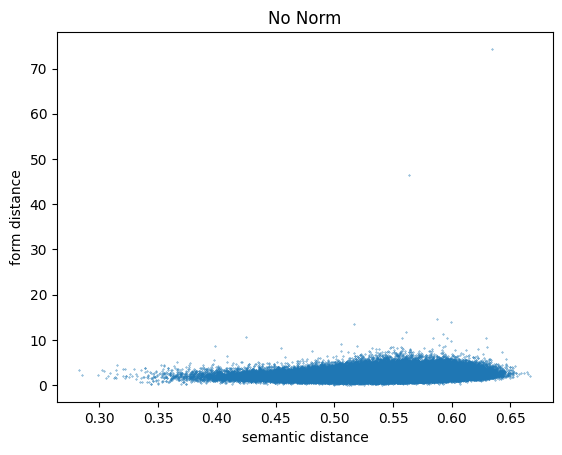

In [22]:
plot_similarities(ROOT + 'measures/test/', 'eng', 0)

million.json million
en 1.1557072554586245
a 2.4960494780948785
o 2.5040831862093516
e 2.49607140791944
s 2.5094047412527734
c 2.5094047412527734
m 2.4606547412527737
d 2.5087797412527735
p 2.5219047412527735
j 2.5219047412527735
l 2.4337797412527737
q 2.5094047412527734
r 2.5081547412527736
u 2.510654741252773
z 2.5094047412527734
ó 2.5069298248648133
á 2.4960494780948785
tx 2.5481547412527736
é 2.49607140791944
qu 2.5169047412527736
hz 2.5144047412527737
rr 2.5219531283495478
í 2.5073459177233617
ñ 2.5094047412527734
tz 2.526904741252774
há 2.5222994780948786
ú 2.510654741252773
hé 2.5223214079194403
hhh 8.106904741252773
én 1.1557072554586245
hó 2.5331798248648134
ón 1.1784400985958792
txh 2.5994047412527737
ahhh 2.6117706319410328
hú 2.5481547412527736
rrhh 2.6372508950989273
ehh 2.548782675525074
uhh 2.5881547412527732
ahhhh 2.6780311361427134
ehhh 2.610128829371228
hih 2.5106547412527735
ohhh 2.64863312156811
hhj 2.5794047412527736
hzh 2.5669047412527735
uhhh 2.65235803795607
ehh

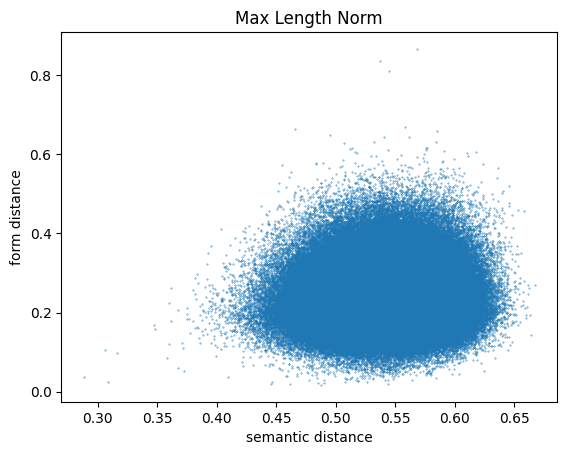

In [19]:
plot_similarities(ROOT + 'measures/test/', 'eng', 1)

party.json party
0.5107316910731825 [1.6273820627830533, 0.24142466675719854, 0.15200763563726766]
Both Min: partido, [0.374202105400381, 0.014662448018912484]
Min Form: parta, 0.009377654522375505
Min Semantic: socialdemócrata, 0.28312743251527606
Mean: (0.5423333057952291, 0.20570699378960272)
STD: (0.03347560277076921, 0.0805891554418178)


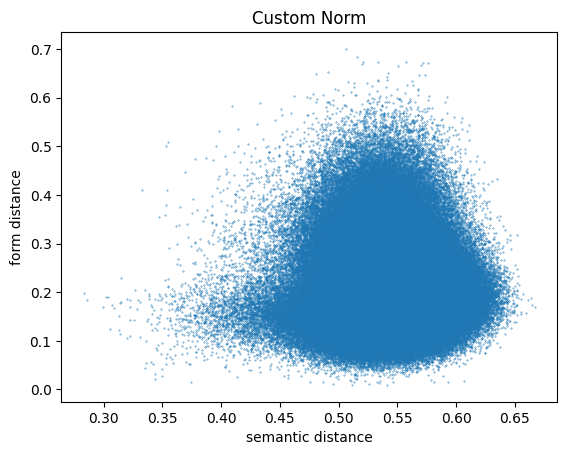

In [24]:
plot_similarities(ROOT + 'measures/test/', 'eng', 2)

In [16]:
import json
from os import listdir

def change_to_similarity(word_pairs: dict) -> dict:
    new = dict()
    for k in word_pairs.keys():
        new[k] = [0.0, 0.0]
        new[k][0] = word_pairs[k][0]
        if word_pairs[k][1] <= 1:
            new[k][1] = 1 - word_pairs[k][1]
        else:
            new.pop(k)
    return new

for filename in listdir(ROOT + 'measures/test/new_en/'):
    if filename[-5:] != '.json':
        continue
    print(filename[:-5])
    with open(ROOT + 'measures/test/new_en/' + filename, 'r') as f:
        pairs = json.load(f)
        print(pairs['huevo'][0], pairs['huevo'][1])
#         new_pairs = change_to_similarity(pairs)
#     print(new_pairs['hermano'][1])
#     with open(ROOT + 'measures/test/' + filename, 'w') as f:
#         json.dump(new_pairs, f)

math
0.4907883253550005 0.5948116259747104
flower
0.5744203000345466 0.6149253153345058
campus
0.4570656380268986 0.5700634732869374
knee
0.4658800970357962 0.5821287847601359
egg
0.7624562047645311 0.5255611451666969
hebrew
0.45646639327010474 0.5759547416057433


sofa.json sofa
Both Min: sofá, [0.708972978651305, 0.8077354111405836]
Max Form: sofaer, 0.9224457366745459 (Semantic similarity: 0.48984037538130354)
Max Semantic: sofá, 0.708972978651305 (Form similarity: 0.8077354111405836)
Mean: (0.4674145995898778, 0.588483441782284)
STD: (0.036740253960685997, 0.10335527651235944)


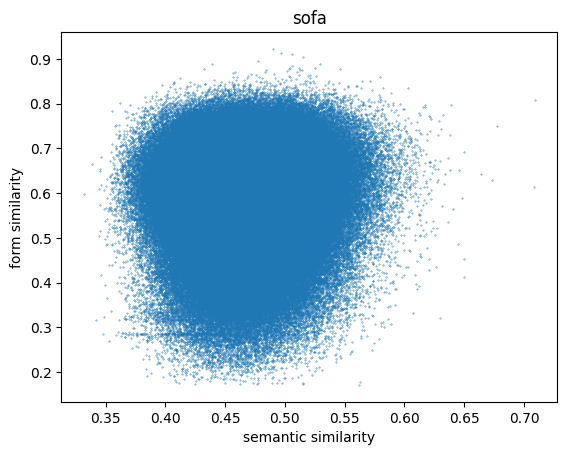

million.json million
Both Min: millón, [0.7116213885648289, 0.9437300838407671]
Max Form: mili, 0.9727888903693936 (Semantic similarity: 0.5122410251558063)
Max Semantic: millón, 0.7116213885648289 (Form similarity: 0.9437300838407671)
Mean: (0.4588821318180038, 0.644687506842349)
STD: (0.034463076477553506, 0.09536141859815601)


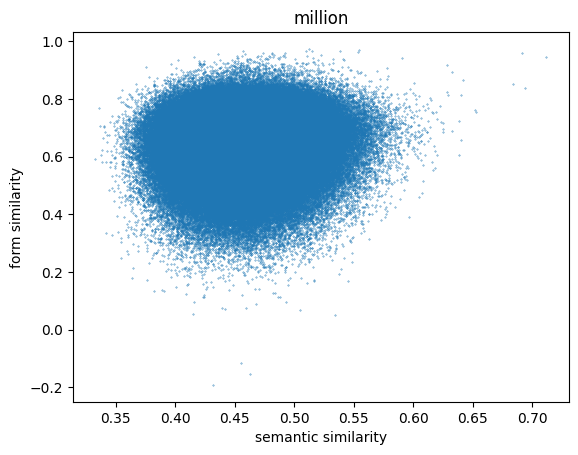

american.json american
Both Min: americano, [0.7020874776321633, 0.9793428244068568]
Max Form: americano, 0.9793428244068568 (Semantic similarity: 0.7020874776321633)
Max Semantic: etadounidense, 0.73319831264019 (Form similarity: 0.7392243660397195)
Mean: (0.4515624548480047, 0.6698330430983761)
STD: (0.029691956557049873, 0.08804949603124873)


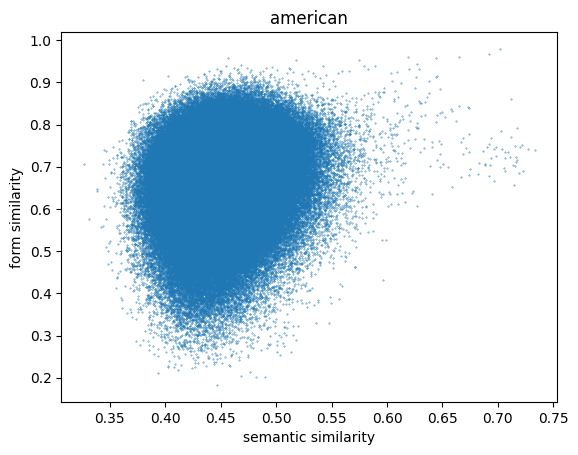

adult.json adult
Both Min: adulto, [0.7524079051930549, 0.9916461733244846]
Max Form: adulto, 0.9916461733244846 (Semantic similarity: 0.7524079051930549)
Max Semantic: adulto, 0.7524079051930549 (Form similarity: 0.9916461733244846)
Mean: (0.4682600372471892, 0.5914389312237757)
STD: (0.031852355920250736, 0.09832944236791176)


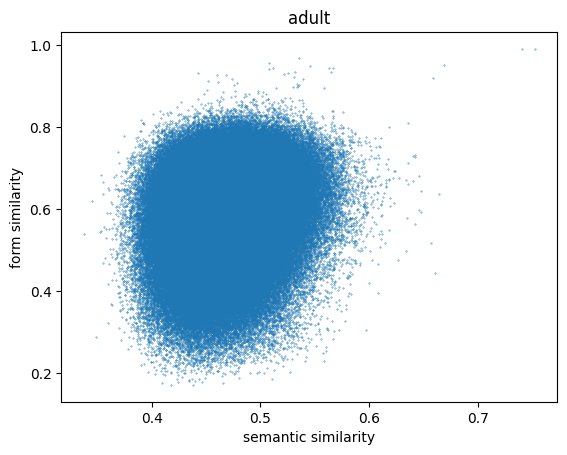

pregnant.json pregnant
Both Min: parto, [0.6839496273927372, 0.8008096126548588]
Max Form: pregonan, 0.9634706760072972 (Semantic similarity: 0.4020663626568179)
Max Semantic: embarazado, 0.7629661420609319 (Form similarity: 0.6821902192395564)
Mean: (0.45158010677108734, 0.6542757418439125)
STD: (0.03637397655778641, 0.08519205679606069)


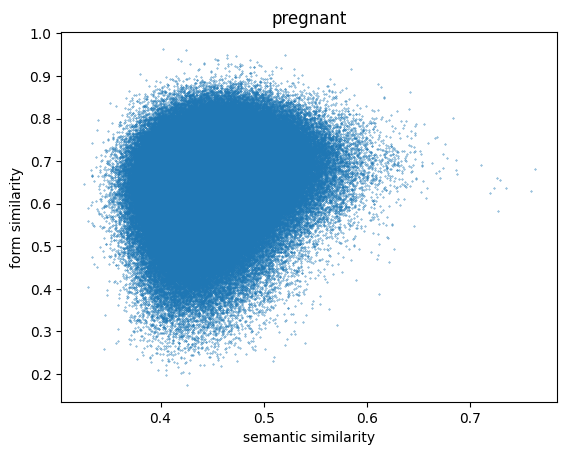

In [27]:
from os import listdir
import json
import matplotlib.pyplot as plt
import numpy

def plot_similarities(words_dir: str, lang: str):
    for filename in listdir(words_dir):
        if filename[-5:] != '.json':
#             print('not json', filename)
            continue
        all_similarities = [list(), list()]
        print(filename, filename[:-5])
        with open(words_dir + filename, 'r') as f:
            similarities = json.load(f)
            min_word, min_word_sem, min_word_form = '', '', ''
            dist_min_word = [0, 0]
            dist_min_sem, dist_min_form = 0, 0
            for word in similarities.keys():
                if similarities[word][1] > 1:
                    print(word, similarities[word][1])
                    continue
                all_similarities[0].append(similarities[word][0])
                all_similarities[1].append(similarities[word][1])
                if similarities[word][0] > dist_min_word[0] and similarities[word][1] > dist_min_word[1]:
                    dist_min_word = [similarities[word][0], similarities[word][1]]
                    min_word = word
                if similarities[word][0] > dist_min_sem:
                    dist_min_sem = similarities[word][0]
                    min_word_sem = word
                if similarities[word][1] > dist_min_form:
                    dist_min_form = similarities[word][1]
                    min_word_form = word
            print(f'Both Min: {min_word}, {dist_min_word}')
            print(f'Max Form: {min_word_form}, {dist_min_form} (Semantic similarity: {similarities[min_word_form][0]})')
            print(f'Max Semantic: {min_word_sem}, {dist_min_sem} (Form similarity: {similarities[min_word_sem][1]})')
            print(f'Mean: ({numpy.mean(all_similarities[0])}, {numpy.mean(all_similarities[1])})')
            print(f'STD: ({numpy.std(all_similarities[0])}, {numpy.std(all_similarities[1])})')
            plt.scatter(all_similarities[0], all_similarities[1], s=0.1)
            plt.title(f'{filename[:-5]}')
            plt.xlabel('semantic similarity')
            plt.ylabel('form similarity')
            plt.show()

plot_similarities(ROOT + 'measures/test/', ENG)

In [2]:
# from sklearn.linear_model import LinearRegression
# from sklearn.decomposition import PCA
import numpy as np
import json
import matplotlib.pyplot as plt

X = [[0.0], [0.2], [0.4], [0.6], [0.8], [1.0]]
Y = [0.1, 0.4, 0.3, 0.5, 0.4, 0.7]

class Cognatehood:
    
    def __init__(self, filename: str, name: str):
        self._name = name
#         self._pca = PCA(n_components=1)
        self._similarities = [[], []]
        self._rev = dict()
        self._mean = [0.0, 0.0]
        self._std = [0.0, 0.0]
        self._updated_mean = [0.0, 0.0]
        self._updated_std = [0.0, 0.0]
        self._word_pairs = self.load_words(filename)
        self._new_dist = [[], []]
#         self._original_reg = LinearRegression().fit(self._similarities[0], self._similarities[1]) 
#         self._updated_reg = LinearRegression().fit(self._similarities[0], self._new_dist)
#         self._reg = LinearRegression().fit(X, Y)
#         self._coef, self._intercept = self._original_reg.coef_, self._original_reg.intercept_
#         print(f'Coef: {self._coef}, Intercept: {self._intercept}\n')
#         self._new_form_similarities = [x - self._intercept for x in self._similarities[1]]
    
    def load_words(self, filename) -> dict:
        with open(filename, 'r') as f:
            w = json.load(f)
        i = 0
        for k in w.keys():
            if 0 <= w[k][1] <= 1:
                self._similarities[0].append([w[k][1]]) # X axis - form sim
                self._similarities[1].append(w[k][0])   #Y axis - semantic sim
                self._rev[i] = k
                i += 1
        self._mean = [np.mean(self._similarities[0]), np.mean(self._similarities[1]), 0.0]
        self._std = [np.std(self._similarities[0]), np.std(self._similarities[1]), 0.0]
        return w
        
#     def create_array(self):
#         return numpy.array([1 - v for v in self._word_pairs.values()])
    
#     def predict(self):
#         print(self._reg.coef_, self._reg.intercept_)
#         for word in self._word_pairs.keys():
#             if word == 'americano':
#                 print('americano')
#                 print(self._word_pairs[word], self._reg.predict([self._similarities[0][self._rev[word]]]))
#             if word == 'casa':
#                 print('casa')
#                 print(self._word_pairs[word], self._reg.predict([self._similarities[0][self._rev[word]]]))
    
    def update_kind(self, kind: str, score: list[float]) -> float:
        if kind == 'stnd_scr':
            return [(score[0] -  self._mean[0]) * (1 / self._std[0]), (score[1] - self._mean[1]) * (1 / self._std[1])]
        if kind == 'diff':
            diff = [self._mean[0] - score[0], self._mean[1] - score[1]]
            return [score[0] - diff[0], score[1] - diff[1]]
        print('Not a valid update!')
    
    def update_dist(self, update: str):
        self._new_dist = [[], []]
        c = 0
        maxi, mini = [0, 0], [1, 1]
#         print('Examples:')
        for j in range(len(self._similarities[1])):
            updated = self.update_kind(update, [self._similarities[0][j][0], self._similarities[1][j]])
#             self._new_dist[0].append(updated[0])
            self._new_dist[1].append(updated[1])
            self._new_dist[0].append(self._similarities[0][j][0])
            for i in [1]:
                if updated[i] > maxi[i]:
                    maxi[i] = updated[i]
                if updated[i] < mini[i]:
                    mini[i] = updated[i]
#             if c % 50000 == 0:
#                 print(self._similarities[0][j][0], updated[0])
#                 print(self._similarities[1][j], updated[1])
            c += 1
        for i in [1]:
            for k in range(len(self._new_dist[0])):
                self._new_dist[i][k] -= mini[i]
                self._new_dist[i][k] /= (maxi[i] - mini[i])
#                 self._new_dist[i][k] += (mini[i] / maxi[i])
        self._updated_mean = [np.mean(self._new_dist[0]), np.mean(self._new_dist[1])]
        self._updated_std = [np.std(self._new_dist[0]), np.std(self._new_dist[1])]

    def plot(self):
        plt.scatter(self._similarities[0], self._similarities[1], s=0.1)
#         x = np.linspace(0.0, 1.0, 100)
#         y = (self._coef * x) + self._intercept
#         plt.plot(x, y, '-r', label='direction')
#         y = [self._reg.predict([[elem]]) for elem in x]
#         plt.plot(x, y, '-g')
#         plt.xlim(0.0, 1.0)
#         plt.ylim(0.0, 1.0)
        plt.title(f'{self._name}')
        plt.xlabel('form similarity')
        plt.ylabel('semantic similarity')
        plt.show()
    
    def plot_new(self, update: str):
        self.update_dist(update)
        plt.scatter(self._new_dist[0], self._new_dist[1], s=0.1)
#         x = numpy.linspace(0.0, 1.0, 100)
#         y = (self._coef * x) + self._intercept
#         plt.plot(x, y, '-r', label='direction')
#         plt.xlim(0.0, 1.0)
#         plt.ylim(0.0, 1.0)
        plt.title(f'{self._name}')
        plt.xlabel('form similarity')
        plt.ylabel('semantic similarity')
        plt.show()
    
    def print_cognates(self, num: int, update: str):
        self.update_dist(update)
        print('Cognates:')
        top = [0] * num
        top_rev = [''] * num
        for i in range(len(self._similarities[0])):
            avg = 0.5 * (self._new_dist[0][i] + self._new_dist[1][i])
            flag = True
            for j in range(num):
                if avg > top[j] and flag:
                    flag = False
                    for k in range(num - j):
                        top[num - 1 - k] = top[num - 2 - k]
                        top_rev[num - 1 - k] = top_rev[num - 2 - k]
                    top[j] = avg
                    top_rev[j] = i
        for i in range(num):
            print(self._rev[top_rev[i]], top[i])
#             if self._new_dist[0][i] > self._updated_mean[0] + (3 * self._updated_std[0]) and self._new_dist[1][i] > self._updated_mean[1] + (3 * self._updated_std[1]):
#                 print(f'{self._rev[i]}: Form = {self._new_dist[0][i]}, Semantic = {self._new_dist[1][i]}')
    
    def plot_hist(self, updated=False):
        for i in [0, 1]:
            sim = 'Form' if i == 0 else 'Semantic'
            if updated:
                print(f'{sim} Mean: {self._updated_mean[i]}\n{sim} STD: {self._updated_std[i]}')
                counts, bins = np.histogram(self._new_dist[i], bins=100)
            else:
                print(f'{sim} Mean: {self._mean[i]}\n{sim} STD: {self._std[i]}')
                counts, bins = np.histogram(self._similarities[i], bins=100)
            plt.stairs(counts, bins)
            plt.title(f'{sim} Similarity')
            plt.show()
    
    def save_new(self, new_file: str):
        new_similarities = dict()
        for i in range(len(self._new_dist[0])):
            word = self._rev[i]
            new_similarities[word] = [self._new_dist[0][i], self._new_dist[1][i]]
        with open(new_file, 'w') as f:
            json.dump(new_similarities, f)

# # English: cancer, chinese, positive
# # Spanish: realidad, siempre, mundo
# cog = Cognatehood(ROOT + 'measures/test/english/chinese.json', 'chinese')
# print('---Original---')
# cog.plot()
# cog.plot_hist()
# print('\n---Standart Score---')
# cog.plot_new('stnd_scr')
# cog.plot_hist(True)
# cog.print_cognates(10, 'stnd_scr')
# # print('\n---By Difference---')
# # cog.plot_new('diff')
# # cog.plot_hist(True)
# # cog.print_cognates()
# cog.save_new(ROOT + 'measures/test/tryout_chinese.json')

---Original---


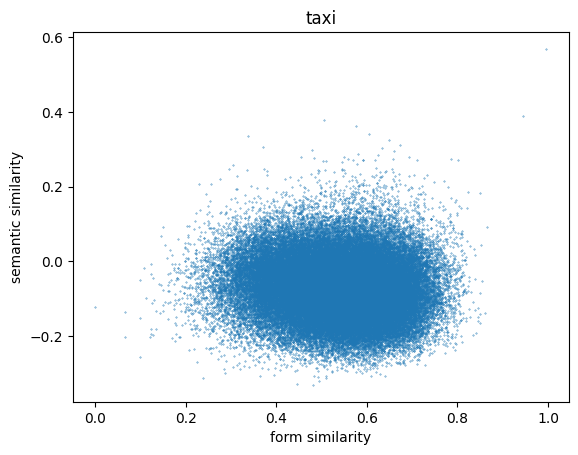

In [3]:
cog = Cognatehood(ROOT + 'measures/en_lemmas_similarities/taxi.json', 'taxi')
print('---Original---')
cog.plot()
# cog.plot_hist()

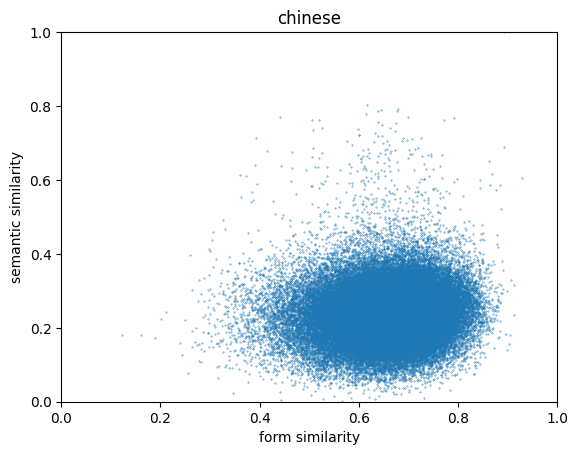

Form Mean: 0.657183594814312
Form STD: 0.08514311658085194


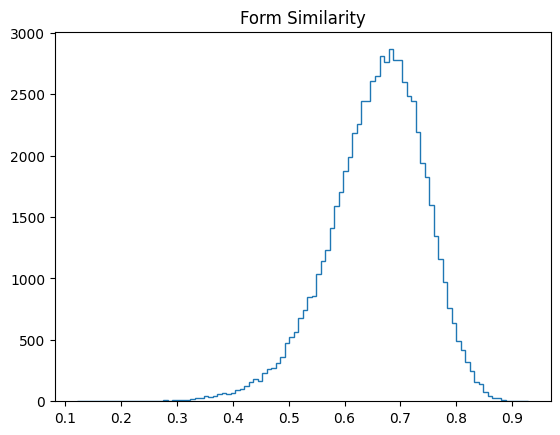

Semantic Mean: 0.23976834553501616
Semantic STD: 0.07215801025979292


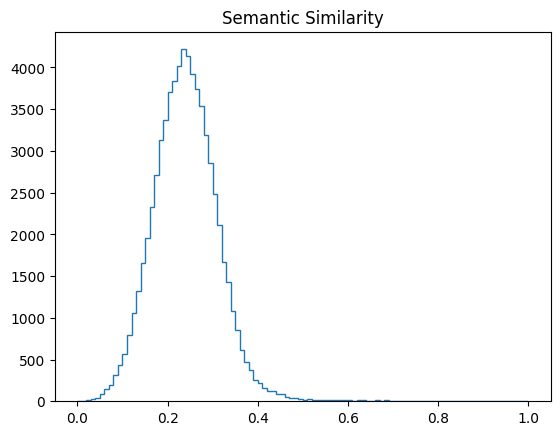

In [10]:
cog = Cognatehood(ROOT + 'measures/test/tryout_chinese.json', 'chinese')
cog.plot()
cog.plot_hist()

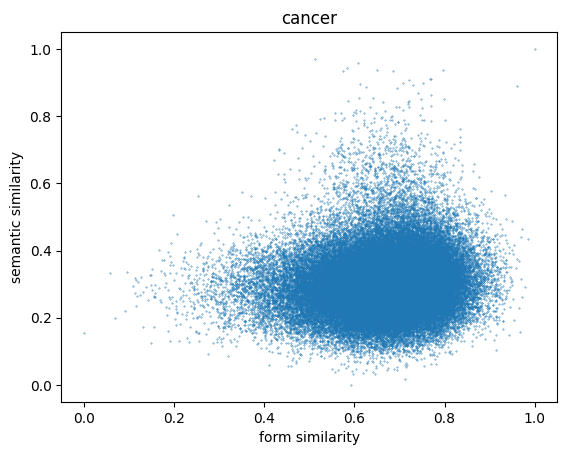

Form Mean: 0.6641712214880218
Form STD: 0.1052830994909138


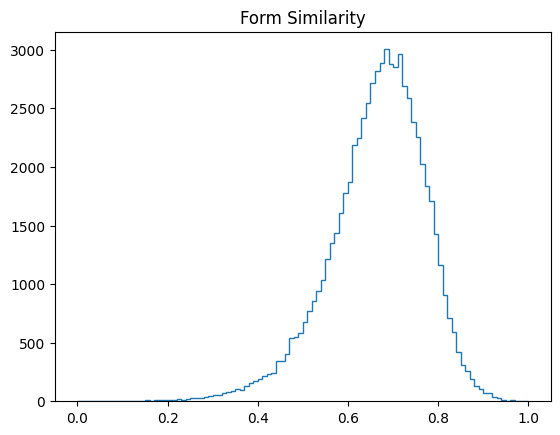

Semantic Mean: 0.30435514478382425
Semantic STD: 0.0892586170540008


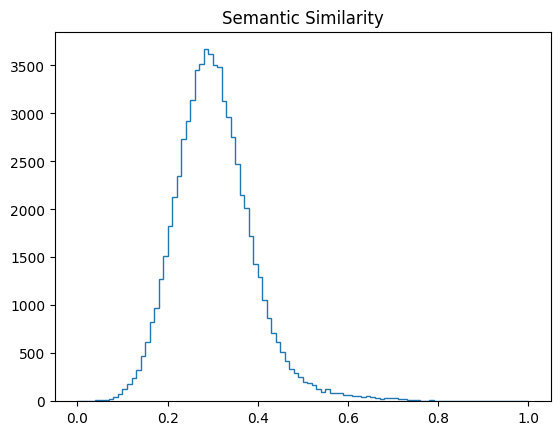

Cognates:
cancer 1.0
canceroso 0.9249883554474532
esclerosis 0.8668286495372113
carcinoma 0.8403710852296636
sida 0.8392497470795153
arteriosclerosis 0.8255446761242972
adenocarcinoma 0.824883275546759
aterosclerosis 0.8154796882113076
mama 0.8145071477577676
arterioesclerosis 0.8102851224980547


In [9]:
cog = Cognatehood(ROOT + 'measures/test/english/cancer.json', 'cancer')
cog.plot_new('stnd_scr')
cog.plot_hist(True)
cog.print_cognates(10, 'stnd_scr')

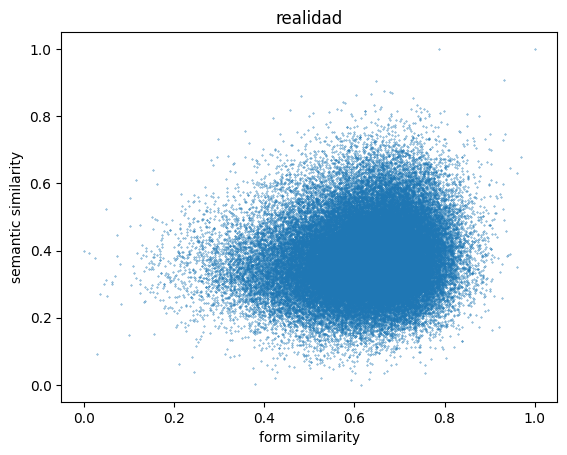

Form Mean: 0.62226833942894
Form STD: 0.1098783433802605


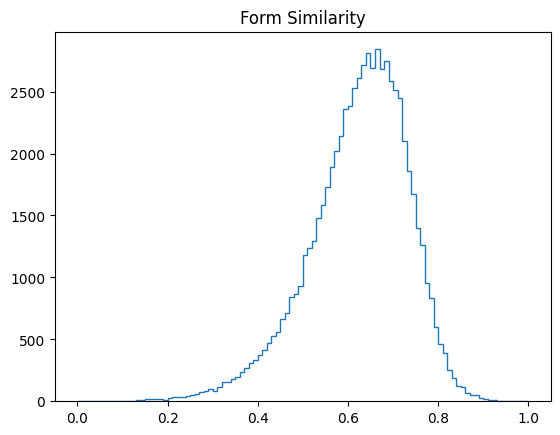

Semantic Mean: 0.38123512894148853
Semantic STD: 0.10636885436509658


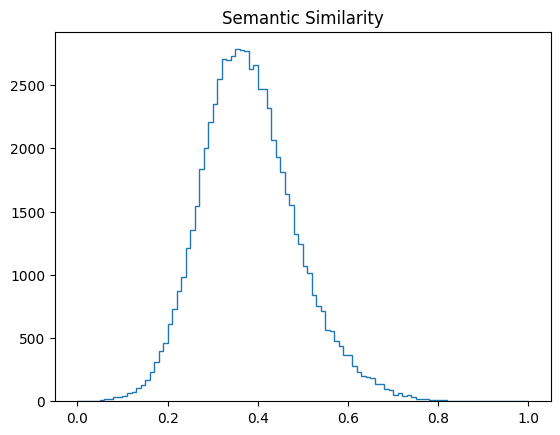

Cognates:
reality 0.9996389603386096
real 0.9197040090689512
actuality 0.89336967883289
realistic 0.8414032142219525
realistically 0.8387826781907648
realise 0.8285268943644111
realize 0.8280504800220975
realisation 0.8245387633311023
realization 0.8233869712701481
recollection 0.8107529439615879


In [10]:
cog = Cognatehood(ROOT + 'measures/test/spanish/realidad.json', 'realidad')
cog.plot_new('stnd_scr')
cog.plot_hist(True)
cog.print_cognates(10, 'stnd_scr')

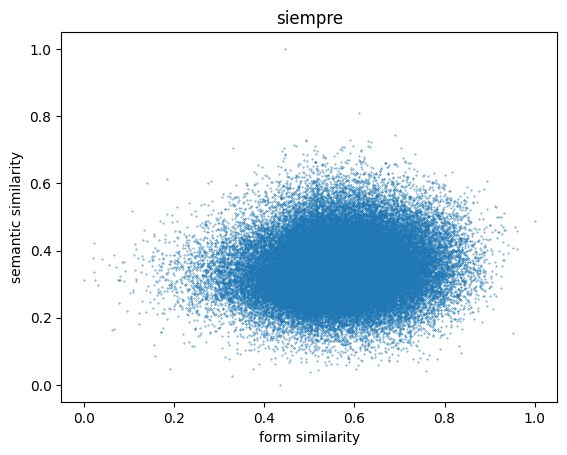

Form Mean: 0.5602560735318874
Form STD: 0.10921365751115751


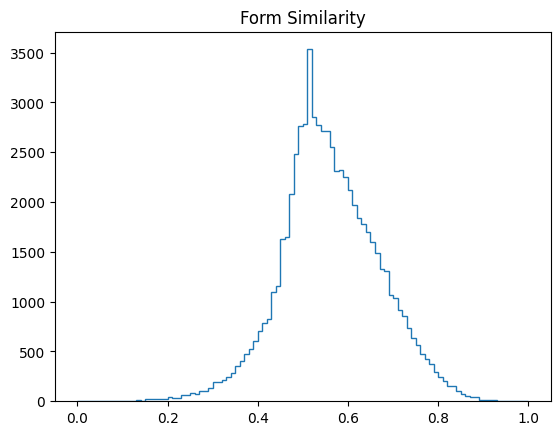

Semantic Mean: 0.3507512552120655
Semantic STD: 0.08551081598694672


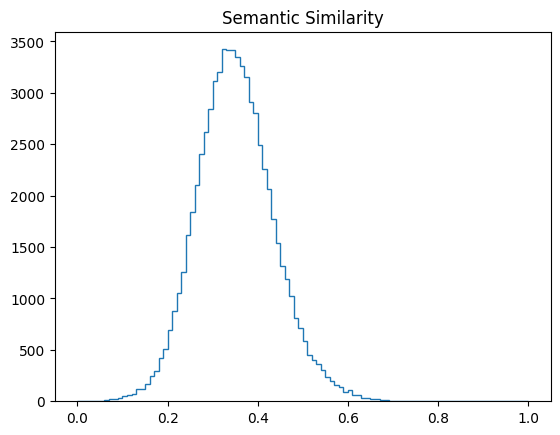

Cognates:
inseparable 0.7511959526381826
sempre 0.7432221039564364
disinterested 0.7360374902654867
simple 0.7261415324882127
instinctively 0.7248585979812379
always 0.7229878251952657
stipulation 0.7223327698672317
desperation 0.7213024750846557
stipulate 0.7210534890950822
unsophisticated 0.7195074386266068


In [13]:
cog = Cognatehood(ROOT + 'measures/test/spanish/siempre.json', 'siempre')
cog.plot_new('stnd_scr')
cog.plot_hist(True)
cog.print_cognates(10, 'stnd_scr')

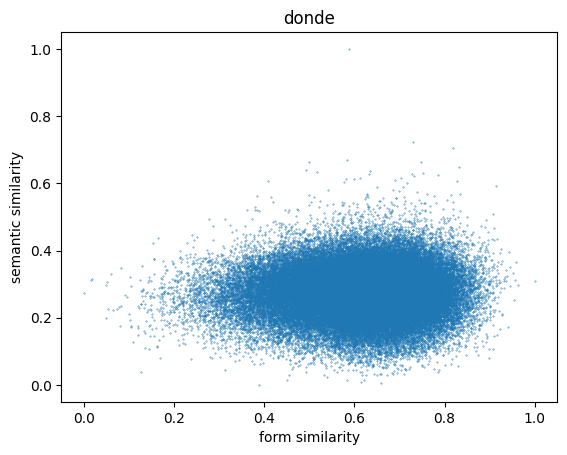

Form Mean: 0.6097056598448399
Form STD: 0.12240446979220602


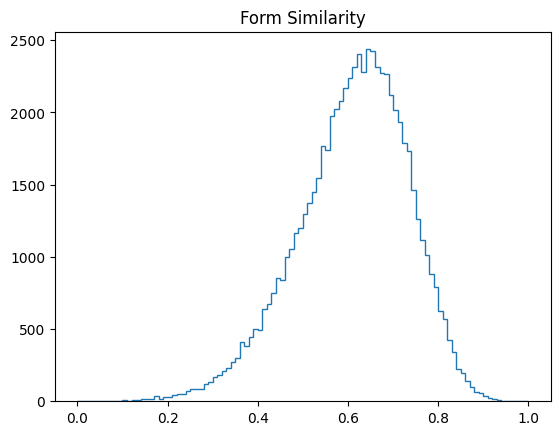

Semantic Mean: 0.2769286424953122
Semantic STD: 0.07103613082404513


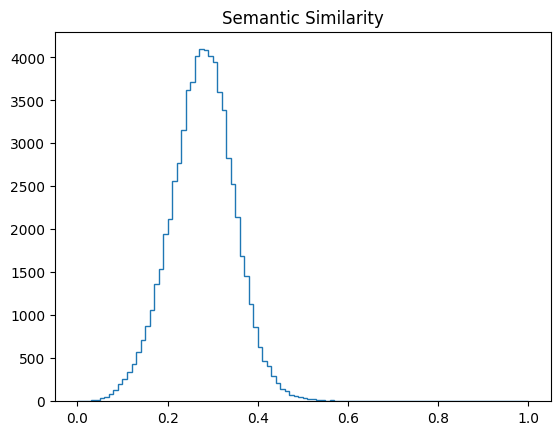

Cognates:
where 0.7943379187724904
in 0.7618881253297766
and 0.7535171265671533
inside 0.7401766335835388
then 0.7257669533694083
on 0.7182302773981739
destination 0.708164960196348
at 0.7060496613084454
once 0.7051972614878657
enter 0.7017272692927483


In [12]:
cog = Cognatehood(ROOT + 'measures/test/spanish/donde.json', 'donde')
cog.plot_new('stnd_scr')
cog.plot_hist(True)
cog.print_cognates(10, 'stnd_scr')

In [28]:
d = {'a': 10, 'b': 100, 'c': 1, 'd': 11, 'e': 15, 'f': 17, 'g': 2}
x = [10, 100, 1, 11, 15, 17, 2]
z = {0: 'a', 1: 'b', 2: 'c', 3: 'd', 4: 'e', 5: 'f', 6: 'g'}

top = [0] * 4
top_rev = [''] * 4
for i in range(len(x)):
    y = x[i]       
    flag = True
    print(i, x[i])
    for j in range(4):
        if y >= top[j] and flag:
#             print(j, top)
            for k in range(3 - j + 1):
                top[3 - k] = top[3 - k - 1]
                top_rev[3 - k] = top_rev[3 - k - 1]
#                 print(k, top, top_rev)
            flag = False
            top[j] = y
            top_rev[j] = z[i]
            print(top, top_rev)

print(top)
print(top_rev)

0 10
[10, 0, 0, 0] ['a', '', '', '']
1 100
[100, 10, 0, 0] ['b', 'a', '', '']
2 1
[100, 10, 1, 0] ['b', 'a', 'c', '']
3 11
[100, 11, 10, 1] ['b', 'd', 'a', 'c']
4 15
[100, 15, 11, 10] ['b', 'e', 'd', 'a']
5 17
[100, 17, 15, 11] ['b', 'f', 'e', 'd']
6 2
[100, 17, 15, 11]
['b', 'f', 'e', 'd']


In [3]:
by_degrees = dict()

with open(ROOT + 'measures/en_cognates.txt', 'r') as f:
    for line in f.readlines():
        line = line.split()
        word, deg, cog = line[0], float(line[1]), line[2]
        if deg in by_degrees.keys():
            by_degrees[deg].append((word, cog))
        else:
            by_degrees[deg] = [(word, cog)]

for k in by_degrees.keys():
    if len(by_degrees[k]) > 1:
        print(k, by_degrees[k])

print()
all_degs = list(by_degrees.keys())
all_degs.sort(reverse=True)


with open(ROOT + 'measures/en_cognates_sorted.txt', 'w') as f:
    for d in all_degs:
        for cogs in by_degrees[d]:
            if cogs[0]:
                f.writelines(f'{cogs[0]} - {cogs[1]}: {round(d, 4)}\n')

In [2]:
class Cognates:
    
    def __init__(self, cognates_file: str):
        self._cognates = dict()
        self._similarities = dict()
        self.load_cognates(cognates_file)
        self._min = min(sim for sim in self._similarities.values())
        self._max = max(sim - self._min for sim in self._similarities.values())
        self._new_similarities = dict((word, (self._similarities[word] - self._min) / self._max) 
                                      for word in self._similarities.keys())
    
    def load_cognates(self, filename: str):
        with open(filename, 'r') as f:
            for line in f.readlines():
                line = line.split()
                word, cog, sim = line[0], line[2][:-1], float(line[3])
                self._cognates[word] = cog
                self._similarities[word] = sim
    
    def write_new_similarities(self, filename: str):
        with open(filename, 'w') as f:
            for word in self._cognates.keys():
                f.writelines(word + ' ' + self._cognates[word] + ' ' + str(round(self._new_similarities[word], 4)) + '\n')

In [6]:
c = Cognates(ROOT + 'measures/cognatehood_final_lists/en_cognates_sorted.txt')
c.write_new_similarities(ROOT + 'measures/en_cognates_final.txt')

In [5]:
with open(ROOT + 'measures/en_lemmas/adorable.json', 'r') as f:
    cogs = json.load(f)
    with open(ROOT + 'measures/en_lemmas_w_one_letter_words/adorable.json', 'r') as ff:
        old_cogs = json.load(ff)
        for k

SyntaxError: invalid syntax (183380239.py, line 5)

In [6]:
import numpy as np
import json
from os import listdir

class Cognatehood:
    
    def __init__(self, en_words: str, es_words: str):
        self._en_dir, self._es_dir = en_words, es_words
        self._temp_mean, self._temp_std = list(), list()
        self._mean, self._std = [0.0, 0.0], [0.0, 0.0]
        self._mini, self._maxi = [-1, -1], [1, 1]
        self.calculate_mean()
        self.calculate_std()
        self.get_min_max()
    
    @staticmethod
    def load_similarities(dirname: str, file_name: str, prev_list=[]) -> (list[list], int):
        if file_name[-5:] != '.json' or len(file_name[:-5]) < 3:
            return [[], []], 0
        similarities = [[], []]
        with open(dirname + file_name, 'r') as f:
            w = json.load(f)
            num_words = 0
            for k in w.keys():
                if 0 <= w[k][1] <= 1 and len(k) > 2:   # Changed only words of length 3 and above
                    if k not in prev_list:
                        num_words += 1
                        similarities[0].append(w[k][0]) # X axis - semantic sim
                        similarities[1].append(w[k][1])   # Y axis - form sim
        return similarities, num_words
    
    def calculate_mean(self):
        done_en = []
        for dir_name in [self._en_dir, self._es_dir]:
            for wf in listdir(dir_name):
                if dir_name == self._en_dir:
                    done_en.append(wf[:-5])
                    similarities, num = self.load_similarities(dir_name, wf)
                else:
                    similarities, num = self.load_similarities(dir_name, wf, done_en)
                if num:
                    self._temp_mean.append([num, [np.mean(similarities[0]), np.mean(similarities[1])]])
        total = [0, 0]
        all_words = 0
        for elem in self._temp_mean:
            print(elem)
            all_words += elem[0]
            for i in [0, 1]:
                total[i] += elem[0] * elem[1][i]
            print(all_words)
            print(total)
        self._mean = [total[i] / all_words for i in [0, 1]]
        print(self._mean)
    
    def calculate_std(self):
        done_en = []
        for dir_name in [self._en_dir, self._es_dir]:
            print(dir_name)
            for wf in listdir(dir_name):
                if dir_name == self._en_dir:
                    done_en.append(wf[:-5])
                    similarities, num = self.load_similarities(dir_name, wf)
                else:
                    similarities, num = self.load_similarities(dir_name, wf, done_en)
                if num:
                    for i in [0, 1]:
                        for j in range(num):
                            similarities[i][j] = (similarities[i][j] - self._mean[i]) ** 2
                    self._temp_std.append([num, [np.mean(similarities[0]), np.mean(similarities[1])]])
        total = [0, 0]
        all_words = 0
        for elem in self._temp_std:
            print(elem)
            all_words += elem[0]
            for i in [0, 1]:
                total[i] += elem[0] * elem[1][i]
            print(all_words)
            print(total)
        self._std = np.sqrt([(total[i] / all_words) for i in [0, 1]])
        print(self._std) 
    
    def standard_score(self, score: list[float]) -> list[float]:
        return [(score[i] -  self._mean[i]) * (1 / self._std[i]) for i in [0, 1]]
    
    def normalize_score(self, score: list[float]):
        return [(score[i] - self._mini[i]) / (self._maxi[i] - self._mini[i]) for i in [0, 1]]
    
    def get_min_max(self):
        maxi, mini = [-1, -1], [1, 1]
        for words_dir in [self._en_dir, self._es_dir]:
            for wf in listdir(words_dir):
                if wf[-5:] != '.json' or len(wf[:-5]) < 3:
                    continue
                with open(words_dir + wf, 'r') as f:
                    word_dict = json.load(f)
                    for elem in word_dict.keys():
                        updated = self.standard_score(word_dict[elem])
                        for i in [0, 1]:
                            if updated[i] > maxi[i]:
                                maxi[i] = updated[i]
                            if updated[i] < mini[i]:
                                mini[i] = updated[i]
        self._mini = mini
        self._maxi = maxi
        print(mini, maxi)
    
    def save_new_scores(self, raw_dir: str, new_dir: str):
        for wf in listdir(raw_dir):
            if wf[-5:] != '.json' or len(wf[:-5:]) < 3:
                continue
            with open(raw_dir + wf, 'r') as f:
                word_dict = json.load(f)
                new = dict()
                for elem in word_dict.keys():
                    print('Before:', word_dict[elem])
                    updated = self.standard_score(word_dict[elem])
                    print('After standardization:', updated)
                    updated = self.normalize_score(updated)
                    new[elem] = updated
                    print('Final, normalized:', updated)
                with open(new_dir + wf, 'w') as f:
                    json.dump(new, f)

In [7]:
cog = Cognatehood(ROOT + 'measures/en_lemmas_raw/', ROOT + 'measures/es_lemmas_raw/')

In [95]:
cog.save_new_scores(ROOT + 'measures/es_lemmas_raw/', ROOT + 'measures/es_lemmas_new/')

Before: [0.01530274693532433, 0.6698293226276358]
After standardization: [1.2935878494760866, 0.19940717295758584]
Final, normalized: [0.40772077691904307, 0.9728267020817697]
Before: [0.007901421962240472, 0.6191664006201817]
After standardization: [1.1844344371982303, -0.35146298256292535]
Final, normalized: [0.39861726842601947, 0.9683937924288132]
Before: [-0.000337402385973024, 0.669274307629411]
After standardization: [1.062929734454353, 0.19337236118057546]
Final, normalized: [0.3884836494187135, 0.9727781393213587]
Before: [0.0665660105025579, 0.737379604083385]
After standardization: [2.0496092595900666, 0.9338976558694841]
Final, normalized: [0.4707737514825923, 0.9787372236794197]
Before: [0.03909445133380269, 0.7148641640470252]
After standardization: [1.6444636356960172, 0.6890818524577239]
Final, normalized: [0.4369841836526635, 0.9767671653503115]
Before: [0.00512688077753388, 0.7067387628984262]
After standardization: [1.1435160017940915, 0.6007324083862443]
Final, norm

Before: [0.05965254466363543, 0.6668450526883203]
After standardization: [1.9476507062595327, 0.16695848700646623]
Final, normalized: [0.46227030173410283, 0.9725655841182406]
Before: [-0.10215538232887601, 0.6156257936818635]
After standardization: [-0.4386635589658552, -0.3899608547239774]
Final, normalized: [0.2632492017321773, 0.9680839960323107]
Before: [-0.14997560707210458, 0.7389392053860151]
After standardization: [-1.1439076504764747, 0.9508555765358728]
Final, normalized: [0.20443110852975271, 0.9788736858374487]
Before: [-0.03525939904137067, 0.7622420816374822]
After standardization: [0.5479063957474335, 1.2042333636053235]
Final, normalized: [0.34553016550848165, 0.9809126433429314]
Before: [0.020894395835590454, 0.7581595798376246]
After standardization: [1.376052483841339, 1.15984333807404]
Final, normalized: [0.4145984134825906, 0.980555432173111]
Before: [-0.07846642393649356, 0.6894712633818983]
After standardization: [-0.0893030524024831, 0.41297872645845307]
Final,

After standardization: [0.2769534782791891, -0.18717191592014593]
Final, normalized: [0.3229324094337311, 0.9697158597942654]
Before: [-0.09333293314567345, 0.691167855442342]
After standardization: [-0.30855166190733413, 0.43142618063517774]
Final, normalized: [0.27410066972752045, 0.9746937832596047]
Before: [-0.06517467236620465, 0.7024597301950671]
After standardization: [0.10672131408903188, 0.5542054549975326]
Final, normalized: [0.30873486929136706, 0.9756818008986972]
Before: [-0.08648947623802389, 0.7110756581813007]
After standardization: [-0.20762558772967554, 0.6478885155409352]
Final, normalized: [0.2825180096371976, 0.9764356782675101]
Before: [-0.07066747672849284, 0.7209474017725784]
After standardization: [0.025714421228787945, 0.755226361679886]
Final, normalized: [0.3019788098905902, 0.9772994371215857]
Before: [-0.0323732296081271, 0.8278767060694339]
After standardization: [0.5904711045254241, 1.917894446221913]
Final, normalized: [0.34908010663975053, 0.9866555485

Before: [-0.14344534134773043, 0.6418411845599324]
After standardization: [-1.0476004636567113, -0.10491459450416557]
Final, normalized: [0.21246322841365659, 0.9703777930474596]
Before: [-0.08307489765061701, 0.7427785475590298]
After standardization: [-0.15726799558748533, 0.9926016688681292]
Final, normalized: [0.28671788537344745, 0.9792096210007869]
Before: [-0.09386462793081361, 0.7189848691747178]
After standardization: [-0.3163930011674597, 0.733887271975615]
Final, normalized: [0.2734466938502522, 0.9771277192389098]
Before: [-0.015625500678836373, 0.6314175507772141]
After standardization: [0.8374636048121621, -0.21825327564320615]
Final, normalized: [0.36967953891722954, 0.969465744847644]
Before: [-0.03057396752586071, 0.5722948828824642]
After standardization: [0.6170062987745298, -0.8611082861216078]
Final, normalized: [0.3512931695314158, 0.9642926234635159]
Before: [0.014128135022654607, 0.6107862601136866]
After standardization: [1.2762648838129942, -0.4425822690386925

After standardization: [1.2174917982074989, 1.67173045312817]
Final, normalized: [0.4013742868318094, 0.9846746412295599]
Before: [-0.01045196994331121, 0.6390447595453053]
After standardization: [0.9137619075296616, -0.13532079733791585]
Final, normalized: [0.3760428969863657, 0.9701331111588136]
Before: [-0.1508606285486217, 0.6783374365666811]
After standardization: [-1.1569597883642644, 0.29191794539385607]
Final, normalized: [0.2033425466091126, 0.9735711459257963]
Before: [-0.018932390825419896, 0.8041191509892788]
After standardization: [0.7886941824667987, 1.6595728267174836]
Final, normalized: [0.36561211819939887, 0.9845768075405628]
Before: [-0.1365917080813602, 0.6380285836204679]
After standardization: [-0.9465243103671419, -0.14636992296215454]
Final, normalized: [0.2208930850778849, 0.9700441976913738]
Before: [-0.16536556407235797, 0.5788502679716339]
After standardization: [-1.3708759740531662, -0.7898300048760768]
Final, normalized: [0.1855017134864894, 0.964866207234

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [98]:
cog.save_new_scores(ROOT + 'measures/en_lemmas_raw/', ROOT + 'measures/en_lemmas_new/')

Before: [-0.0315870979748885, 0.6888050997980661]
After standardization: [0.6020648327537638, 0.40573536933480053]
Final, normalized: [0.3500470356728424, 0.97448704661892]
Before: [-0.07579880703956901, 0.6853348935230195]
After standardization: [-0.04996151720327163, 0.36800298054479036]
Final, normalized: [0.2956673576523394, 0.9741834101470217]
Before: [-0.051792436939776844, 0.7600503679534985]
After standardization: [0.3040801202504084, 1.180402332742656]
Final, normalized: [0.3251947996826368, 0.9807208725495923]
Before: [-0.004481819887029929, 0.6966782134754944]
After standardization: [1.0018086090086287, 0.4913416309570072]
Final, normalized: [0.38338608377246586, 0.975175929143587]
Before: [0.028094802964698812, 0.7273714615923539]
After standardization: [1.48224279581794, 0.8250767116354628]
Final, normalized: [0.4234547963182917, 0.9778615301801358]
Before: [0.02193777448401995, 0.6846639148048452]
After standardization: [1.3914400448777902, 0.36070726730548675]
Final, nor

Before: [-0.09296948520544841, 0.6697994230997923]
After standardization: [-0.3031915969182688, 0.19908206818864435]
Final, normalized: [0.2745477047412029, 0.9728240859297527]
Before: [-0.019949971827833243, 0.7560981417399042]
After standardization: [0.7736870804835089, 1.1374288250437796]
Final, normalized: [0.36436051023305527, 0.9803750602466553]
Before: [-0.15339505856860883, 0.6474594289761949]
After standardization: [-1.19433710740742, -0.04382606954930047]
Final, normalized: [0.2002252391951249, 0.9708693787854843]
Before: [-0.0020689488737889814, 0.6240808423521866]
After standardization: [1.0373931976382833, -0.2980270737377744]
Final, normalized: [0.38635387559913076, 0.9688237967659]
Before: [-0.016010854315157245, 0.6476259584943217]
After standardization: [0.8317804785488145, -0.04201535398228751]
Final, normalized: [0.3692055602561355, 0.9708839498026928]
Before: [-0.017201675522278977, 0.5816215660270134]
After standardization: [0.8142184611204655, -0.7596970135232287]

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Final, normalized: [0.3403076472501382, 0.9760749112961112]
Before: [0.041926016380288256, 0.6965802131185069]
After standardization: [1.6862230487787568, 0.4902760494675144]
Final, normalized: [0.4404669622825673, 0.975167354298093]
Before: [-0.01716484224833188, 0.814776451374428]
After standardization: [0.8147616716336252, 1.775452221114281]
Final, normalized: [0.36778617399911984, 0.985509301125217]
Before: [-0.057917108072882736, 0.4168570442102729]
After standardization: [0.21375456966461331, -2.5512213504751364]
Final, normalized: [0.3176615545028924, 0.9506921071848995]
Before: [0.033977894028889434, 0.7699105796641987]
After standardization: [1.5690055669073184, 1.2876147899660955]
Final, normalized: [0.4306909019700309, 0.9815836223859741]
Before: [-0.07268818817787633, 0.49099694610245026]
After standardization: [-0.004086668539769825, -1.745080337139781]
Final, normalized: [0.2994933679044173, 0.9571792080812656]
Before: [-0.013401926434286754, 0.7626833101182322]
After sta

Final, normalized: [0.2829959607783298, 0.9713711532801683]
Before: [-0.019064673610488834, 0.6704476977601483]
After standardization: [0.7867432996953485, 0.20613091473795653]
Final, normalized: [0.3654494125403803, 0.9728808087338428]
Before: [-0.06570160745784029, 0.7681823975109622]
After standardization: [0.09895016993441849, 1.2688238491004833]
Final, normalized: [0.3080867477591519, 0.9814324097230325]
Before: [-0.09018206913784498, 0.7603818669293965]
After standardization: [-0.26208328505201284, 1.1840068009646223]
Final, normalized: [0.27797618085018333, 0.9807498780816851]
Before: [-0.08311900740406493, 0.6352986662509623]
After standardization: [-0.1579185183143058, -0.17605297214902169]
Final, normalized: [0.2866636310991657, 0.9698053350956223]
Before: [-0.05426666842868406, 0.741042471736874]
After standardization: [0.26759059833889914, 0.9737248982387983]
Final, normalized: [0.3221515354759054, 0.9790577176567758]
Before: [0.006619910775196199, 0.8321060379898524]
After

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [14]:
import json
from os import listdir

raw_dir = listdir(ROOT + 'measures/en_lemmas_raw/')
new_dir = listdir(ROOT + 'measures/en_lemmas_similarities/')

for wf in new_dir:
    if wf not in raw_dir:
        print(wf)
        continue
    with open(ROOT + 'measures/en_lemmas_raw/' + wf, 'r') as f:
        old_file = json.load(f)
        with open(ROOT + 'measures/en_lemmas_similarities/' + wf, 'r') as f:
            new_file = json.load(f)
            for elem in new_file.keys():
                if new_file[elem][1] and new_file[elem][1] != old_file[elem][1]:
                    print(wf, elem, new_file[elem], old_file[elem])
                if new_file[elem][0] != old_file[elem][0]:
                    print(wf, elem, new_file[elem], old_file[elem])

backstage.json
misuse.json
fest.json
nigga.json
binge.json
dislike.json
tradition.json
mirror.json
randomly.json
lighten.json
skool.json
workout.json
numb.json
nappy.json
layup.json
booty.json
jetpack.json
rial.json
patriot.json
cranky.json
bby.json
sow.json
spitting.json
secluded.json
catchy.json
swe.json
cocaine.json
platinum.json
swipe.json
boyz.json
clocking.json
hectic.json
dis.json
roughly.json
swag.json
tingle.json
shawn.json
contest.json
beast.json
flee.json
headband.json
sexy.json
reliever.json
deadpool.json
performance.json
dildo.json
epcot.json
indecisive.json
denim.json
diz.json
viner.json
infact.json
decay.json
tender.json
pub.json
flatbread.json
faggot.json
blaze.json
tune.json
pipe.json
cleavage.json
offside.json
kippur.json
timber.json
username.json
feat.json
meh.json
mole.json
noob.json
nutshell.json
creamer.json
aim.json
turquoise.json
mis.json
intrigue.json
bot.json
daydream.json
grammar.json
teddy.json
ireland.json
wright.json
tru.json
swatch.json
projectile.json
sy

announce.json
magic.json
tanning.json
instinct.json
scoop.json
prix.json
drone.json
addiction.json
xxx.json
society.json
cheer.json
ninja.json
nop.json
assassination.json
gif.json
mate.json
tot.json
sitcom.json
valley.json
craft.json
lover.json
ultimate.json
hassle.json
contemporary.json
prove.json
dong.json
dull.json
primal.json
salesman.json
harm.json
carb.json
lol.json
entitle.json
shameless.json
itt.json
hostess.json
sigh.json
latte.json
ing.json
flashback.json
coat.json
musician.json
sid.json
ime.json
backfire.json
esteem.json
arch.json
pin.json
precedent.json
infiniti.json
allstar.json
photoshoot.json
thirsty.json
purge.json
continuous.json
serial.json
whom.json
achieve.json
timezone.json
angie.json
smiley.json
freaky.json
mph.json
spider.json
bless.json
crossfit.json
noggin.json
celebrity.json
dick.json
promo.json
premiere.json
jury.json
par.json
scapegoat.json
stranger.json
smh.json
perse.json
mat.json
chuck.json
das.json
unstable.json
winner.json
segway.json
reservation.json
g

In [ ]:
import json
from os import listdir

raw_dir = listdir(ROOT + 'measures/es_lemmas_raw/')
new_dir = listdir(ROOT + 'measures/es_lemmas_similarities/')

for wf in new_dir:
    if wf not in raw_dir:
        print(wf)
        continue
    with open(ROOT + 'measures/es_lemmas_raw/' + wf, 'r') as f:
        old_file = json.load(f)
        with open(ROOT + 'measures/es_lemmas_similarities/' + wf, 'r') as f:
            new_file = json.load(f)
            for elem in new_file.keys():
                if new_file[elem][1] and new_file[elem][1] != old_file[elem][1]:
                    print(wf, elem, new_file[elem], old_file[elem])
                if new_file[elem][0] != old_file[elem][0]:
                    print(wf, elem, new_file[elem], old_file[elem])

arrebatado.json
cobro.json
meo.json
dame.json
fest.json
millonario.json
seriedad.json
woo.json
acortar.json
entrega.json
remate.json
diva.json
turno.json
cala.json
cantarla.json
discriminar.json
tin.json
hueva.json
reponer.json
retiro.json
pecas.json
alargar.json
saver.json
vencer.json
covacha.json
sustituto.json
cuneta.json
saludar.json
buffalo.json
verbalmente.json
debate.json
descarga.json
imponente.json
apoyo.json
sexy.json
caratula.json
lidiar.json
chingo.json
premio.json
cera.json
saludado.json
radicar.json
culpable.json
abuso.json
matricula.json
corregir.json
reggaeton.json
adobo.json
oral.json
competitividad.json
incrementar.json
tender.json
poste.json
fuga.json
haver.json
trio.json
cargo.json
alboroto.json
incondicional.json
improbable.json
pele.json
desconocido.json
yal.json
pri.json
textura.json
expectativa.json
proteina.json
ligero.json
gritado.json
hispanohablante.json
abdominal.json
capitulo.json
rueda.json
xxi.json
dever.json
mui.json
adorable.json
vibrante.json
mole.jso

playita.json
interno.json
reducir.json
justiciero.json
vamo.json
lobo.json
panorama.json
helada.json
cres.json
estalactita.json
muelle.json
bas.json
camaro.json
disculpen.json
mama.json
exquisito.json
floral.json
bra.json
decidio.json
centrar.json
tequila.json
pupitre.json
reis.json
fam.json
diverso.json
surgir.json
zumo.json
proceder.json
ace.json
conquistador.json
indice.json
aguacero.json
central.json
chile.json
creativo.json
arepa.json
seminario.json
tip.json
rudo.json
komo.json
duelo.json
intenso.json
sobrevivir.json
rival.json
vid.json
taliban.json
remix.json
brutal.json
poseer.json
completar.json
borrachera.json
arrasar.json
minimo.json
agridulce.json
punta.json
ampliar.json
testarudo.json
cura.json
modelar.json
min.json
luciano.json
despacio.json
record.json
relacionado.json
anormal.json
hermanito.json
avatar.json
madrina.json
placita.json
mamar.json
vulva.json
demonio.json
tama.json
experto.json
afecto.json
inolvidable.json
ram.json
mural.json
absorbente.json
lombriz.json
pend

medallista.json
tembleque.json
jurado.json
sinaloense.json
taza.json
parodia.json
siesta.json
barniz.json
vaquera.json
suelo.json
callejero.json
mental.json
invicto.json
premiar.json
elote.json
agencia.json
finde.json
perdonad.json
bronze.json
pecoso.json
vengar.json
pajaro.json
disparo.json
terminal.json
volante.json
seguidor.json
huir.json
aportar.json
clasificado.json
bipolaridad.json
acer.json
cancelan.json
carretera.json
estuche.json
supremo.json
moneda.json
pose.json
habichuela.json
dear.json
recibo.json
cedral.json
dalia.json
birria.json
calibre.json
declarar.json
guineo.json
anhelo.json
contactar.json
reprobar.json
zoologico.json
ameritar.json
oler.json
oro.json
apocalipsis.json
chil.json
impresionar.json
acero.json
llorado.json
plane.json
menta.json
savia.json
gratuito.json
palomita.json
envite.json
fav.json
frase.json
diadema.json
matadero.json
amir.json
alma.json
post.json
app.json
linda.json
neon.json
randa.json
honda.json
kinder.json
tobillo.json
mutante.json
torneo.json
m

In [8]:
from os import listdir
import json

raw = listdir(ROOT + 'measures/es_lemmas_raw/')
new = listdir(ROOT + 'measures/es_lemmas_similarities/')
print(len(raw), len(new))

for elem in raw:
    if elem in new:
        with open(ROOT + 'measures/es_lemmas_raw/' + elem, 'r') as f:
            r = json.load(f)
        with open(ROOT + 'measures/es_lemmas_similarities/' + elem, 'r') as f:
            n = json.load(f)
        for w in r.keys():
            if w in n.keys() and not n[w][1]:
                n[w][1] = r[w][1]
        with open(ROOT + 'measures/es_lemmas_similarities/' + elem, 'w') as f:
            print(elem)
            json.dump(n, f)

2667 4834
mermelada.json
pesar.json
humilde.json
gordo.json
acostar.json
sueldo.json
pregunta.json
cuadrado.json
oyo.json
apretado.json
verde.json
hum.json
vejez.json
pasivo.json
tumbar.json
manzanilla.json
mantel.json
primero.json
calma.json
chocar.json
traspasar.json
realeza.json
utero.json
asado.json
hijo.json
rendir.json
gracias.json
alcohol.json
limpio.json
idolo.json
extra.json
gris.json
edad.json
valer.json
sombrerito.json
inmaduro.json
comienzo.json
rusia.json
mayoria.json
recurso.json
camisa.json
drama.json
tamal.json
sobre.json
flota.json
cancelar.json
heredar.json
estante.json
mantener.json
pedacito.json
lujo.json
constantemente.json
reemplazo.json
mantequilla.json
extranjero.json
convenir.json
triunfo.json
libertad.json
excusa.json
libra.json
abuelo.json
pea.json
mismo.json
lema.json
pila.json
enfermero.json
estandar.json
resultar.json
guau.json
hermana.json
acceso.json
nunca.json
artificial.json
juguete.json
francamente.json
precioso.json
pariente.json
movido.json
gobernad

sobrino.json
ese.json
bombardeo.json
nicaraguense.json
sentimental.json
mano.json
quinteto.json
calculadora.json
salto.json
perfectamente.json
cazar.json
bolsa.json
rotonda.json
plaza.json
rabia.json
alo.json
misa.json
razon.json
solitario.json
acercar.json
ultimo.json
liberar.json
pelo.json
regalo.json
enamorar.json
documental.json
traido.json
citar.json
tratamiento.json
pala.json
congelar.json
todavia.json
republicano.json
especificar.json
fastidioso.json
beso.json
absolutamente.json
lago.json
rincon.json
sanar.json
asfalto.json
lucecita.json
comparar.json
sustentar.json
anillo.json
nobel.json
reaccionar.json
suiza.json
trampa.json
fruta.json
baile.json
vulgar.json
foto.json
besito.json
lote.json
llave.json
corcho.json
bastante.json
positivo.json
perrito.json
experimental.json
modo.json
practicar.json
circulo.json
responder.json
calendario.json
hora.json
reguero.json
masticar.json
confundido.json
platicar.json
ovario.json
queso.json
cua.json
chin.json
divino.json
divertir.json
agotad

guaro.json
celoso.json
presente.json
polo.json
exacto.json
realidad.json
tren.json
independiente.json
chico.json
vaina.json
trece.json
existencia.json
producir.json
mamita.json
sucio.json
dana.json
clasificar.json
ocupar.json
rode.json
rubio.json
desarmar.json
bandeja.json
frijol.json
virar.json
nominar.json
cerrado.json
cristo.json
identidad.json
quedar.json
unir.json
dilatado.json
juego.json
curado.json
dieciocho.json
estatus.json
ver.json
machismo.json
brava.json
reunir.json
cara.json
silbar.json
cursi.json
bendecido.json
aburrido.json
ahi.json
hundir.json
biblia.json
mancha.json
trabajador.json
hispano.json
basquetbol.json
prestar.json
rumbo.json
sinceramente.json
primavera.json
capacitado.json
sierra.json
soledad.json
entendimiento.json
politico.json
veinticinco.json
pensar.json
impresionante.json
version.json
suelto.json
torre.json
silenciosamente.json
evento.json
mono.json
cojo.json
comandancia.json
treinta.json
principio.json
aparecer.json
harina.json
garbanzo.json
cuatro.json


ritmo.json
aparentemente.json
finca.json
mensualidad.json
saltar.json
casual.json
tocar.json
quema.json
siembra.json
individual.json
usual.json
americana.json
supuestamente.json
oxigeno.json
ira.json
pobrecito.json
gasolina.json
abstracto.json
recto.json
deporte.json
velocidad.json
enciclopedia.json
mar.json
desesperado.json
increible.json
catalogo.json
rescatar.json
echar.json
doblar.json
bebida.json
estado.json
toma.json
calificar.json
proyecto.json
reja.json
negar.json
solamente.json
union.json
celebridad.json
suficiente.json
eiffel.json
papel.json
hermanita.json
electronico.json
tesoro.json
utilizar.json
partida.json
morcilla.json
cafetero.json
diplomacia.json
desafortunadamente.json
cuestion.json
dominio.json
bazo.json
millon.json
culpa.json
estabilizar.json
servir.json
cerca.json
apoyar.json
cayo.json
aburrir.json
responsable.json
venite.json
perro.json
escuela.json
despues.json
maduro.json
asequible.json
civil.json
oia.json
volver.json
parasitar.json
ducha.json
saco.json
mente.j

mezcla.json
ganador.json
imposible.json
pierna.json
diecinueve.json
noviembre.json
murio.json
miedo.json
dentro.json
remedio.json
medicina.json
oido.json
manager.json
escaner.json
ganar.json
regalito.json
pareja.json
intensivo.json
celular.json
quinientos.json
joder.json
pana.json
sano.json
vidrio.json
santo.json
bendito.json
peleado.json
blanco.json
cuerpo.json
divertido.json
ceja.json
moder.json
sorprendido.json
alrededor.json
disgustado.json
tomar.json
acelerado.json
permiso.json
reconocer.json
chiquita.json
entregar.json
cuenta.json
seguro.json
almohadilla.json
loco.json
sabio.json
rey.json
artritis.json
jovencito.json
grua.json
canal.json
satisfecho.json
mensual.json
juez.json
soler.json
apreciar.json
figurar.json
posponer.json
botado.json
tubo.json
excelente.json
palito.json
salon.json
religioso.json
regado.json
secretaria.json
conectar.json
tostar.json
sangrar.json
patear.json
fisico.json
carecer.json
deber.json
diccionario.json
tal.json
accidente.json
sal.json
discoteca.json
cu

In [2]:
import numpy as np
import json
from os import listdir

class Cognatehood:
    
    def __init__(self, en_words: str, es_words: str):
        self._en_dir, self._es_dir = en_words, es_words
        self._temp_mean, self._temp_std = list(), list()
        self._mean, self._std = [0.0, 0.0], [0.0, 0.0]
        self._mini, self._maxi = [-1, -1], [1, 1]
        self.calculate_mean()
        self.calculate_std()
        self.get_min_max()
    
    def get_mean_std(self):
        done_en = []
        all_sim = [[], []]
        for dir_name in [self._en_dir, self._es_dir]:
            for wf in listdir(dir_name):
                if dir_name == self._en_dir:
                    done_en.append(wf[:-5])
                    if wf[-5:] != '.json' or len(wf[:-5]) < 3:
                        continue
                    with open(dir_name + wf, 'r') as f:
                        w = json.load(f)
                    for k in w.keys():
                        if 0 <= w[k][1] <= 1 and len(k) > 2:   # Changed only words of length 3 and above
                            similarities[0].append(w[k][0]) # X axis - semantic sim
                            similarities[1].append(w[k][1])   # Y axis - form sim
                else:
                    if wf[-5:] != '.json' or len(wf[:-5]) < 3:
                        continue
                    with open(dir_name + wf, 'r') as f:
                        w = json.load(f)
                    for k in w.keys():
                        if 0 <= w[k][1] <= 1 and len(k) > 2:   # Changed only words of length 3 and above
                            if k not in done_en:
                                similarities[0].append(w[k][0]) # X axis - semantic sim
                                similarities[1].append(w[k][1])   # Y axis - form sim
        mean = [np.mean(similarities[0]), np.mean(similarities[1])]
        std = [np.std(similarities[0]), np.std(similarities[1])]
        print(f'Mean: {mean}\nSTD: {std}')
    
    @staticmethod
    def load_similarities(dirname: str, file_name: str, prev_list=[]) -> (list[list], int):
        if file_name[-5:] != '.json' or len(file_name[:-5]) < 3:
            return [[], []], 0
        similarities = [[], []]
        with open(dirname + file_name, 'r') as f:
            w = json.load(f)
            num_words = 0
            for k in w.keys():
                if 0 <= w[k][1] <= 1 and len(k) > 2:   # Changed only words of length 3 and above
                    if k not in prev_list:
                        num_words += 1
                        similarities[0].append(w[k][0]) # X axis - semantic sim
                        similarities[1].append(w[k][1])   # Y axis - form sim
        return similarities, num_words
    
    def calculate_mean(self):
        done_en = []
        for dir_name in [self._en_dir, self._es_dir]:
            for wf in listdir(dir_name):
                if dir_name == self._en_dir:
                    done_en.append(wf[:-5])
                    similarities, num = self.load_similarities(dir_name, wf)
                else:
                    similarities, num = self.load_similarities(dir_name, wf, done_en)
                if num:
                    self._temp_mean.append([num, [np.mean(similarities[0]), np.mean(similarities[1])]])
        total = [0, 0]
        all_words = 0
        for elem in self._temp_mean:
            all_words += elem[0]
            for i in [0, 1]:
                total[i] += elem[0] * elem[1][i]
        self._mean = [total[i] / all_words for i in [0, 1]]
        print('Mean:', self._mean)
    
    def calculate_std(self):
        done_en = []
        for dir_name in [self._en_dir, self._es_dir]:
#             print(dir_name)
            for wf in listdir(dir_name):
                if dir_name == self._en_dir:
                    done_en.append(wf[:-5])
                    similarities, num = self.load_similarities(dir_name, wf)
                else:
                    similarities, num = self.load_similarities(dir_name, wf, done_en)
                if num:
                    for i in [0, 1]:
                        for j in range(num):
                            similarities[i][j] = (similarities[i][j] - self._mean[i]) ** 2
                    self._temp_std.append([num, [np.mean(similarities[0]), np.mean(similarities[1])]])
        total = [0, 0]
        all_words = 0
        for elem in self._temp_std:
            all_words += elem[0]
            for i in [0, 1]:
                total[i] += elem[0] * elem[1][i]
        self._std = np.sqrt([(total[i] / all_words) for i in [0, 1]])
        print('STD:', self._std) 
    
    def standard_score(self, score: list[float]) -> list[float]:
        return [(score[i] -  self._mean[i]) * (1 / self._std[i]) for i in [0, 1]]
    
    def normalize_score(self, score: list[float]):
        return [(score[i] - self._mini[i]) / (self._maxi[i] - self._mini[i]) for i in [0, 1]]
    
    def get_min_max(self):
        old_max, old_min = [-1, -1], [1, 1]
        maxi, mini = [-1, -1], [1, 1]
        for words_dir in [self._en_dir, self._es_dir]:
            for wf in listdir(words_dir):
                if wf[-5:] != '.json' or len(wf[:-5]) < 3:
                    continue
                with open(words_dir + wf, 'r') as f:
                    word_dict = json.load(f)
                    for elem in word_dict.keys():
                        updated = self.standard_score(word_dict[elem])
                        for i in [0, 1]:
                            if updated[i] > maxi[i]:
                                maxi[i] = updated[i]
                            if updated[i] < mini[i]:
                                mini[i] = updated[i]
                            if word_dict[elem][i] > old_max[i]:
                                old_max[i] = word_dict[elem][i]
                            if word_dict[elem][i] < old_min[i]:
                                old_min[i] = word_dict[elem][i]
        self._mini = mini
        self._maxi = maxi
        print(f'Min: {mini}\nMax: {maxi}\nOld Min: {old_min}\nOld Max: {old_max}')
    
    def save_new_scores(self, raw_dir: str, new_dir: str):
        for wf in listdir(raw_dir):
            if wf[-5:] != '.json' or len(wf[:-5:]) < 3:
                continue
            with open(raw_dir + wf, 'r') as f:
                word_dict = json.load(f)
                new = dict()
                for elem in word_dict.keys():
                    if len(elem) > 2:
                        updated = self.standard_score(word_dict[elem])
                        updated = self.normalize_score(updated)
                        new[elem] = updated
                with open(new_dir + wf, 'w') as f:
                    json.dump(new, f)

In [26]:
cog = Cognatehood(ROOT + 'measures/try_out/', ROOT + 'measures/try_out_es/')

Mean: [-0.07241108495875644, 0.6514900643649854]
STD: [0.06780663 0.0919689 ]
Min: [-3.595089311796147, -120.69211524119203]
Max: [8.39516833024432, 3.5761867651690578]
Old Min: [-0.3161819735511381, -10.448430960765785]
Old Max: [0.49683698268488874, 0.9803880258032024]


In [27]:
cog.get_mean_std()

NameError: name 'similarities' is not defined

In [2]:
import numpy as np
import json
from os import listdir
from math import sqrt

class Cognatehood:
    
    def __init__(self, en_words: str, es_words: str, bad_words_en: str, bad_words_es: str):
        self._en_dir, self._es_dir = en_words, es_words
        self._bad_words_en, self._bad_words_es = bad_words_en, bad_words_es
        self._temp_mean, self._temp_std = list(), list()
        self._mean = [0.07194480432566823, 0.5520306309560289]
        self._std = [sqrt(0.005402400642062465), sqrt(0.018831563941916915)]
        self._min = [-6.9437483342869175, -4.0227216405561]
        self._max = [8.57268218095818, 3.2644131939536964]
#         self.calculate_mean()
#         self.calculate_std()
        self.get_min_max()
    
    @staticmethod
#     def load_similarities(dirname: str, file_name: str, bad_words: str, prev_list=[]) -> (list[list], int):
    def load_similarities(dirname: str, file_name: str, prev_list=[]) -> (list[list], int):
        similarities, num_words = [[], []], 0
        if len(file_name[:-5]) < 3:
            print(file_name, file_name[-5:])
        if file_name[-5:] == '.json':
            with open(dirname + file_name, 'r') as f:
                try:
                    w = json.load(f)
                except:
                    print(file_name)
                    w = dict()
                for k in w.keys():
                    if 0 <= w[k][1] <= 1 and len(k) > 2:   # Changed only words of length 3 and above
                        if k not in prev_list:
                            num_words += 1
                            similarities[0].append(w[k][0])   # X axis - semantic sim
                            similarities[1].append(w[k][1])   # Y axis - form sim
#                     elif len(k) > 2:
#                         with open(bad_words, 'a') as ff:
#                             ff.writelines(f'{file_name[:-5]} {k} {w[k][0]} {w[k][1]}\n')
        return similarities, num_words
    
    def calculate_mean(self):
        done_en = []
        total, count = [0, 0], 0
        c = 0
        for dir_name in [self._en_dir, self._es_dir]:
            print(dir_name)
            print(total, count)
            for wf in listdir(dir_name):
                if dir_name == self._en_dir:
                    done_en.append(wf[:-5])
                    similarities, num = self.load_similarities(dir_name, wf, self._bad_words_en)
                else:
                    similarities, num = self.load_similarities(dir_name, wf, self._bad_words_es, done_en)
                for i in [0,1]:
                    total[i] += sum(similarities[i])
                count += num
                c += 1
                if c % 1000 == 0:
                    print(c)
        self._mean = [total[i] / count for i in [0, 1]]
        print('Mean:', self._mean)
    
    def calculate_std(self):
        done_en = []
        total, count = [0, 0], 0
        c = 0
        for dir_name in [self._en_dir, self._es_dir]:
            print(dir_name)
            print(total, count)
            for wf in listdir(dir_name):
                if dir_name == self._en_dir:
                    done_en.append(wf[:-5])
                    similarities, num = self.load_similarities(dir_name, wf)
                else:
                    similarities, num = self.load_similarities(dir_name, wf, done_en)
                if num:
                    for i in [0, 1]:
                        for j in range(num):
                            similarities[i][j] = (similarities[i][j] - self._mean[i]) ** 2
                        total[i] += sum(similarities[i])
                count += num
                c += 1
                if c % 1000 == 0:
                    print(c)
        self._std = [sqrt(total[i] / count) for i in [0, 1]]
        print('STD:', self._std)
    
    def standard_score(self, score: list[float]) -> list[float]:
        return [(score[i] -  self._mean[i]) * (1 / self._std[i]) for i in [0, 1]]
    
    def normalize_score(self, score: list[float]):
        return [(score[i] - self._mini[i]) / (self._maxi[i] - self._mini[i]) for i in [0, 1]]
    
    def get_min_max(self):
        maxi, mini = [-1, -1], [1, 1]
        count = 0
        for words_dir in [self._en_dir, self._es_dir]:
            for wf in listdir(words_dir):
                if wf[-5:] != '.json' or len(wf[:-5]) < 3:
                    continue
                count += 1
                if count % 1000 == 0:
                    print(wf[:-5], count)
                with open(words_dir + wf, 'r') as f:
                    try:
                        word_dict = json.load(f)
                    except:
                        print(wf)
                        word_dict = dict()
                    for elem in word_dict.keys():
                        if 0 <= word_dict[elem][1] <= 1:
                            updated = self.standard_score(word_dict[elem])
                            for i in [0, 1]:
                                if updated[i] > maxi[i]:
                                    maxi[i] = updated[i]
                                if updated[i] < mini[i]:
                                    mini[i] = updated[i]
                        else:
                            print(wf[:-5], elem, word_dict[elem][1])
        self._min = mini
        self._max = maxi
        print(f'Min: {mini}\nMax: {maxi}')
    
    def save_new_scores(self, raw_dir: str, new_dir: str):
        for wf in listdir(raw_dir):
            if wf[-5:] != '.json' or len(wf[:-5:]) < 3:
                continue
            with open(raw_dir + wf, 'r') as f:
                try:
                    word_dict = json.load(f)
                except:
                    print(wf)
                    word_dict = dict()
                new = dict()
                for elem in word_dict.keys():
                    if len(elem) > 2 and 0 <= word_dict[elem][1] <= 1:
                        updated = self.standard_score(word_dict[elem])
                        updated = self.normalize_score(updated)
                        new[elem] = updated
                with open(new_dir + wf, 'w') as f:
                    json.dump(new, f)


In [ ]:
cog = Cognatehood(ROOT + 'measures/en_lemmas_similarities/', ROOT + 'measures/es_lemmas_similarities/',
                 ROOT + 'measures/bad_word_pairs_en.txt', ROOT + 'measures/bad_word_pairs_es.txt')

In [10]:
from os import listdir
import json

def get_cog(word: str, full_path_file: str, cognates_file: str) -> (str, float):
    cognatehood, cognate = 0, ''
    with open(full_path_file, 'r') as f:
        try:
            similarities = json.load(f)
        except:
            print(word)
            return
    for elem in similarities.keys():
        coghood = (similarities[elem][0] + similarities[elem][1]) / 2
        if coghood > cognatehood:
            cognatehood = coghood
            cognate = elem
    with open(cognates_file, 'a') as f:
        f.writelines(f'{word} {cognate} {cognatehood}\n')


def all_cogs(words_path: str, cognates_file: str):
    for filename in listdir(words_path):
        get_cog(filename[:-5], words_path + filename, cognates_file)

In [11]:
all_cogs(ROOT + 'measures/en_lemmas_new/', ROOT + 'measures/cognatehood_final_lists/en_cognates.txt')

In [ ]:
all_cogs(ROOT + 'measures/es_lemmas_new/', ROOT + 'measures/cognatehood_final_lists/es_cognates.txt')

In [ ]:
by_degrees = dict()

with open(ROOT + 'measures/cognatehood_final_lists/es_cognates.txt', 'r') as f:
    for line in f.readlines():
        line = line.split()
        if len(line) < 3:
            print(line)
        else:
            word, cog, deg = line[0], line[1], float(line[2])
            if deg in by_degrees.keys():
                by_degrees[deg].append((word, cog))
            else:
                by_degrees[deg] = [(word, cog)]

for k in by_degrees.keys():
    if len(by_degrees[k]) > 1:
        print(k, by_degrees[k])

print()
all_degs = list(by_degrees.keys())
all_degs.sort(reverse=True)


with open(ROOT + 'measures/cognatehood_final_lists/es_cognates_sorted.txt', 'w') as f:
    for d in all_degs:
        for cogs in by_degrees[d]:
            if cogs[0]:
                f.writelines(f'{cogs[0]} - {cogs[1]}: {round(d, 4)}\n')

In [4]:
minimum, maximum = 1, 0

with open(ROOT + 'measures/cognatehood_final_lists/es_cognates_sorted.txt', 'r') as f:
    for line in f.readlines():
        line = line.split()
        if len(line) < 3:
            print(line)
        else:
            word, cog, deg = line[0], line[2], float(line[3])
            if deg < minimum:
                minimum = deg

print(minimum, maximum) 

with open(ROOT + 'measures/cognatehood_final_lists/en_cognates_sorted.txt', 'r') as f:
    for line in f.readlines():
        line = line.split()
        if len(line) < 3:
            print(line)
        else:
            word, cog, deg = line[0], line[2], float(line[3])
            if deg < minimum:
                minimum = deg

print(minimum, maximum) 

with open(ROOT + 'measures/cognatehood_final_lists/es_cognates_sorted.txt', 'r') as f:
    for line in f.readlines():
        line = line.split()
        if len(line) < 3:
            print(line)
        else:
            word, cog, deg = line[0], line[2], float(line[3])
            if deg - minimum > maximum:
                maximum = deg - minimum

print(minimum, maximum) 

with open(ROOT + 'measures/cognatehood_final_lists/en_cognates_sorted.txt', 'r') as f:
    for line in f.readlines():
        line = line.split()
        if len(line) < 3:
            print(line)
        else:
            word, cog, deg = line[0], line[2], float(line[3])
            if deg - minimum > maximum:
                maximum = deg - minimum

print(minimum, maximum)            

0.5826 0
0.5607 0
0.5607 0.42380000000000007
0.5607 0.4283


In [8]:
with open(ROOT + 'measures/cognatehood_final_lists/es_cognates_sorted.txt', 'r') as f:
    with open(ROOT + 'measures/cognatehood_final_lists/es_cognates_sorted_streched.txt', 'w') as ff:
        for line in f.readlines():
            line = line.split()
            if len(line) < 3:
                print(line)
            else:
                word, cog, deg = line[0], line[2][:-1], float(line[3])
                ff.writelines(f'{word} - {cog}: {round((deg - minimum)/maximum, 4)}\n')

metal metal 0.9845
inventor inventor 0.9836
arquitectura architecture 0.9819
pro pro 0.98
modelo model 0.9793
sistema system 0.9786
identidad identity 0.9763
poeta poet 0.9717
princesa princess 0.9704
control control 0.9675
universo universe 0.967
volumen volume 0.9667
hospital hospital 0.9666
universidad university 0.9663
nobel nobel 0.9652
oral oral 0.9633
experimental experimental 0.9631
hotel hotel 0.963
ram ram 0.962
director director 0.9613
estructura structure 0.9609
feminista feminist 0.9597
accidente accident 0.959
formal formal 0.9589
poema poem 0.9585
acceso access 0.9581
roma rome 0.9578
polar polar 0.9576
terminal terminal 0.9571
festival festival 0.957
abu abu 0.9558
novela novel 0.9553
artista artist 0.9552
reserva reserve 0.9537
central central 0.9537
cultura culture 0.9532
actor actor 0.9529
plan plan 0.9525
super super 0.9525
evento event 0.9524
crisis crisis 0.9522
donar donate 0.9517
equivalente equivalent 0.9517
conflicto conflict 0.9516
portal portal 0.9514
extra 

In [3]:
from os import listdir
import json

en_words = [word[:-5] for word in listdir(ROOT + 'measures/en_lemmas_new/')]
es_words = [word[:-5] for word in listdir(ROOT + 'measures/es_lemmas_new/')]


def test_pair(en_word: str, es_word: str):
    if en_word in en_words:
        first, second = en_word, es_word
        filename = ROOT + f'measures/en_lemmas_new/{en_word}.json'
    elif es_word in es_words:
        first, second = es_word, en_word
        filename = ROOT + f'measures/es_lemmas_new/{es_word}.json'
    else:
        return
    with open(filename, 'r') as f:
        word_dict = json.load(f)
    if second in word_dict.keys():
        return word_dict[second]

non_cogs_form, non_cogs_meaning = [], []

with open(ROOT + 'measures/non_cognates.txt', 'r') as f:
#     with open(ROOT + 'measures/non_cognates_w_cognatehood.txt', 'w') as ff:
        for line in f.readlines():
            line = line.split(',')
            en_cog, es_cog = line[0], line[1][:-1]
            cognatehood = test_pair(en_cog, es_cog)
            if cognatehood:
#                 ff.writelines(f'{en_cog} - {es_cog}: Meaning: {cognatehood[0]}; Form: {cognatehood[1]}; Cognatehood: {(cognatehood[0]+cognatehood[1])/2} \n')
                non_cogs_meaning.append(cognatehood[0])
                non_cogs_form.append(cognatehood[1])

KeyboardInterrupt: 

In [43]:
cogs = []

with open(ROOT + 'measures/cognate_list.txt', 'r') as f:
    with open(ROOT + 'measures/cognates_w_cognatehood.txt', 'w') as ff:
        for line in f.readlines():
            line = line.split(',')
            en_cog, es_cog = line[0], line[1][:-1]
            cognatehood = test_pair(en_cog, es_cog)
            if cognatehood:
                ff.writelines(f'{en_cog} - {es_cog}: Meaning: {cognatehood[0]}; Form: {cognatehood[1]}; Cognatehood: {(cognatehood[0]+cognatehood[1])/2} \n')
                cogs.append((cognatehood[0]+cognatehood[1])/2)

print(sum(cogs)/len(cogs))

In [4]:
with open(ROOT + 'measures/non_cognates.txt', 'r') as f:
#     with open(ROOT + 'measures/non_cognates_w_cognatehood.txt', 'w') as ff:
        for line in f.readlines():
            line = line.split(',')
            en_cog, es_cog = line[0], line[1][:-1]
            cognatehood = test_pair(en_cog, es_cog)
            if cognatehood:
#                 ff.writelines(f'{en_cog} - {es_cog}: Meaning: {cognatehood[0]}; Form: {cognatehood[1]}; Cognatehood: {(cognatehood[0]+cognatehood[1])/2} \n')
                non_cogs_meaning.append(cognatehood[0])
                non_cogs_form.append(cognatehood[1])

print(sum(non_cogs_form)/len(non_cogs_form))
print(sum(non_cogs_meaning)/len(non_cogs_meaning))

0.6143428048420537
0.35144175216769213


In [46]:
print(sum(cogs)/len(cogs))

0.851756367845079


In [5]:
non_cogs_form, non_cogs_meaning = [], []

with open(ROOT + 'measures/cognate_list.txt', 'r') as f:
#     with open(ROOT + 'measures/non_cognates_w_cognatehood.txt', 'w') as ff:
        for line in f.readlines():
            line = line.split(',')
            en_cog, es_cog = line[0], line[1][:-1]
            cognatehood = test_pair(en_cog, es_cog)
            if cognatehood:
#                 ff.writelines(f'{en_cog} - {es_cog}: Meaning: {cognatehood[0]}; Form: {cognatehood[1]}; Cognatehood: {(cognatehood[0]+cognatehood[1])/2} \n')
                non_cogs_meaning.append(cognatehood[0])
                non_cogs_form.append(cognatehood[1])

print(sum(non_cogs_form)/len(non_cogs_form))
print(sum(non_cogs_meaning)/len(non_cogs_meaning))

0.9271543050790003
0.7763584306111531


In [3]:
en_cognates, es_cognates = dict(), dict()

with open(ROOT + 'measures/cognatehood_final_lists/en_cognates.txt', 'r') as f:
    for line in f.readlines():
        line = line.split()
        if len(line) > 2:
            word, cognate, cognatehood = line[0], line[1], float(line[2])
            en_cognates[word] = [cognate, cognatehood]

with open(ROOT + 'measures/cognatehood_final_lists/es_cognates.txt', 'r') as f:
    for line in f.readlines():
        line = line.split()
        word, cognate, cognatehood = line[0], line[1], float(line[2])
        es_cognates[word] = [cognate, cognatehood]

In [6]:
count = 0

with open(ROOT + 'measures/cognatehood_final_lists/cognates_intersection_2.txt', 'w') as f:
    for lemma in en_cognates.keys():
        if en_cognates[lemma][0] in es_cognates.keys() and es_cognates[en_cognates[lemma][0]][0] == lemma:
            count += 1
            f.writelines(lemma + '\t' + en_cognates[lemma][0] + '\t' + str(en_cognates[lemma][1]) + '\n')
            print(lemma, en_cognates[lemma][0], en_cognates[lemma][1])

sell vender 0.7904259087578549
fest fest 0.944791181657642
simply simplemente 0.8735408179241013
woo woo 0.8105816291900387
advantage ventaja 0.8057340417537643
declare declarar 0.9195357870659462
adjust ajustar 0.8958937971878596
bust busto 0.8965482107051521
public publico 0.7899067471516299
bottle botella 0.8544596597193792
complaint queja 0.7353564116927807
invitation invitado 0.838880986503579
alcohol alcohol 0.9434436932614231
extra extra 0.950678255768226
care cuidado 0.7946204859265323
council consejo 0.7979556024511625
son sobrino 0.813425418873403
caribbean caribe 0.9028170488074031
modern moderno 0.8930907985469647
drama drama 0.8892698968726307
mind mente 0.8522937673663039
boat bote 0.8476953716853396
contest concurso 0.8085837693996637
hormone hormona 0.8855813628662146
distance distancia 0.8906947466982089
sexy sexy 0.9265582660798412
psychology psicologia 0.8106716320742073
rent rentar 0.8373349449177461
value valor 0.8530216087850873
paint pintar 0.8832738241020962
bat

In [7]:
print(count)

1278


In [10]:
by_degrees = dict()

with open(ROOT + 'measures/cognatehood_final_lists/cognates_intersection_2.txt', 'r') as f:
    for line in f.readlines():
        line = line.split('\t')
        word, deg, cog = line[0], float(line[2]), line[1]
        if deg in by_degrees.keys():
            by_degrees[deg].append((word, cog))
        else:
            by_degrees[deg] = [(word, cog)]

for k in by_degrees.keys():
    if len(by_degrees[k]) > 1:
        print(k, by_degrees[k])

print()
all_degs = list(by_degrees.keys())
all_degs.sort(reverse=True)


with open(ROOT + 'measures/cognatehood_final_lists/intersection_sorted.txt', 'w') as f:
    for d in all_degs:
        for cogs in by_degrees[d]:
            if cogs[0]:
                f.writelines(f'{cogs[0]}\t{cogs[1]}\t{round(d, 4)}\n')

In [7]:
from random import sample

all_words = dict()
cog_intersection_filename = ROOT + 'measures/cognatehood_final_lists/intersection_sorted.txt'
samples_cog_intersection_filename = ROOT + 'measures/cognatehood_final_lists/intersection_sorted_samples.txt'

count = 0
with open(cog_intersection_filename, 'r') as f:
    with open(samples_cog_intersection_filename, 'r') as ff:
        for line in f.readlines():
            line = line.split('\t')
            en_word, es_word, cog = line[0], line[1], float(line[2])
            all_words[en_word] = [es_word, cog]

samples = sample(list(all_words.keys()), 140)

In [8]:
for s in samples:
    print(s, all_words[s][0], all_words[s][1])

site sitio 0.8696
animal animal 0.9481
genre genero 0.756
contest concurso 0.8086
bitch bicha 0.6706
suitcase maleta 0.7927
avenue avenida 0.8562
yes yes 0.7632
closet closet 0.8326
steel acero 0.8397
interested interesar 0.8804
industry industria 0.9029
accept aceptar 0.8873
chat chat 0.8965
bipolar bipolar 0.9133
adjust ajustar 0.8959
dear dear 0.7859
cactus cactus 0.888
record record 0.8648
space espacio 0.8966
festival festival 0.9624
much mucho 0.8454
desert desierto 0.8704
tell enterar 0.7915
july julio 0.8482
discount descuento 0.8324
cellular celular 0.8842
title titulo 0.8317
process proceso 0.9485
recognize reconocer 0.8923
bleacher boliche 0.6607
sushi sushi 0.894
warehouse almacen 0.6754
empire imperio 0.8669
really realmente 0.8274
combine combinar 0.911
city ciudad 0.8625
bravo bravo 0.784
activity actividad 0.9273
adapt adaptar 0.9209
essay ensayo 0.8139
rebel rebelde 0.8803
escape escapar 0.9108
mount monte 0.8727
create crear 0.9469
vice vice 0.896
honest honesto 0.893

In [9]:
more_samples = sample(list(all_words.keys()), 20)

In [10]:
for s in more_samples:
    if s not in samples:
        print(s, all_words[s][0], all_words[s][1])

latte lata 0.7765
probably probablemente 0.8935
term termino 0.8013
bring brindar 0.7501
bae bae 0.9107
minor menor 0.8315
exhausting exhausto 0.7386
apart aparte 0.7799
treatment tratamiento 0.8884
accord acordar 0.7889
administration administracion 0.8487
battle batalla 0.9254
governor gobernador 0.9203
zumba zumba 0.8219
delay adelantar 0.7707


In [6]:
# from random import sample
# from os import listdir
# import json

# en_words = ROOT + 'measures/en_lemmas_new/'
# es_words = ROOT + 'measures/es_lemmas_new/'

# en_list = listdir(en_words)
# es_list = listdir(es_words)

# en_samples = sample(en_list, 500)
# es_samples = sample(es_list, 500)

# en_pairs, es_pairs = [], []

# for samp in en_samples:
#     with open(en_words + samp, 'r') as f:
#         sim_dict = json.load(f)
#         pairs = sample(sim_dict.keys(), 2)
#         for pair in pairs:
#             en_pairs.append((samp[:-5], pair, round((sim_dict[pair][0] + sim_dict[pair][1]) * 0.5, 4)))

# for samp in es_samples:
#     with open(es_words + samp, 'r') as f:
#         sim_dict = json.load(f)
#         pairs = sample(sim_dict.keys(), 2) 
#         for pair in pairs:
#             en_pairs.append((samp[:-5], pair, round((sim_dict[pair][0] + sim_dict[pair][1]) * 0.5, 4)))

en_words = [word[:-5] for word in en_list]
es_words = [word[:-5] for word in es_list]

with open(ROOT + 'pairs_for_survey_en.txt', 'w') as f:
    for elem in en_pairs:
        if elem[1] in es_words:
            f.writelines(elem[0] + ' ' + elem[1] + ' ' + str(elem[2]) + '\n')
        
with open(ROOT + 'pairs_for_survey_es.txt', 'w') as f:
    for elem in en_pairs:
        if elem[1] in en_words:
            f.writelines(elem[0] + ' ' + elem[1] + ' ' + str(elem[2]) + '\n')

In [3]:
from os import listdir
import json

en_words = ROOT + 'measures/en_lemmas_new/'
es_words = ROOT + 'measures/es_lemmas_new/'

en_list = listdir(en_words)
es_list = [word[:-5] for word in listdir(es_words)]

pairs = {0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}

for elem in en_list:
    with open(en_words + elem, 'r') as f:
        sim_dict = json.load(f)
        for elem_es in es_list:
            sim = round((sim_dict[elem_es][0] + sim_dict[elem_es][1]) * 0.5, 4)
            pairs[round(sim * 10)].append((elem, elem_es, sim))

KeyError: 10

In [6]:
import json
from numpy import mean, std

with open(ROOT + 'measures/all_dataset_pairs.json', 'r') as f:
    all_pairs = json.load(f)

for k in all_pairs.keys():
    for elem in all_pairs[k]:
        if elem[1] == 'mmmm':
            all_pairs[k].remove(elem)
            print(elem)
        
all_sim = []

for k in all_pairs.keys():
    print(f'Cognatehood {int(k)/10}-{(int(k)/10)+0.1}: {len(all_pairs[k])}')
    for elem in all_pairs[k]:
        all_sim.append(elem[2])

print(len(all_sim), mean(all_sim), std(all_sim))

['tent.json', 'mmmm', 0.1433]
['flee.json', 'mmmm', 0.1408]
['grit.json', 'mmmm', 0.1469]
['deer.json', 'mmmm', 0.1248]
['heel.json', 'mmmm', 0.1451]
['shu.json', 'mmmm', 0.1361]
['age.json', 'mmmm', 0.1494]
['pine.json', 'mmmm', 0.1217]
['lust.json', 'mmmm', 0.1358]
['nude.json', 'mmmm', 0.1459]
['sale.json', 'mmmm', 0.1473]
['club.json', 'mmmm', 0.1303]
['stag.json', 'mmmm', 0.145]
['cord.json', 'mmmm', 0.1493]
['dawn.json', 'mmmm', 0.1302]
['prix.json', 'mmmm', 0.144]
['pier.json', 'mmmm', 0.1377]
['cork.json', 'mmmm', 0.1473]
['edge.json', 'mmmm', 0.1474]
['hall.json', 'mmmm', 0.1286]
['pole.json', 'mmmm', 0.134]
['soil.json', 'mmmm', 0.1433]
['elk.json', 'mmmm', 0.1207]
['art.json', 'mmmm', 0.1183]
['rear.json', 'mmmm', 0.1258]
['oak.json', 'mmmm', 0.1308]
['fund.json', 'mmmm', 0.1416]
['wire.json', 'mmmm', 0.1467]
['east.json', 'mmmm', 0.1446]
['frey.json', 'mmmm', 0.1457]
['nery.json', 'mmmm', 0.1497]
['porn.json', 'mmmm', 0.2269]
['sell.json', 'mmmm', 0.1696]
['fully.json', 'mm

['jazz.json', 'mmmm', 0.1667]
['other.json', 'mmmm', 0.2222]
['cast.json', 'mmmm', 0.1526]
['end.json', 'mmmm', 0.194]
['even.json', 'mmmm', 0.2176]
['brag.json', 'mmmm', 0.2313]
['down.json', 'mmmm', 0.198]
['deli.json', 'mmmm', 0.1892]
['bunk.json', 'mmmm', 0.1899]
['trash.json', 'mmmm', 0.2318]
['apa.json', 'mmmm', 0.2158]
['burn.json', 'mmmm', 0.1858]
['give.json', 'mmmm', 0.2476]
['rule.json', 'mmmm', 0.2463]
['teach.json', 'mmmm', 0.2294]
['lap.json', 'mmmm', 0.1859]
['save.json', 'mmmm', 0.1825]
['farr.json', 'mmmm', 0.1952]
['brink.json', 'mmmm', 0.2374]
['hunt.json', 'mmmm', 0.1515]
['big.json', 'mmmm', 0.2446]
['hose.json', 'mmmm', 0.1925]
['clift.json', 'mmmm', 0.2471]
['lead.json', 'mmmm', 0.2043]
['tee.json', 'mmmm', 0.2367]
['shed.json', 'mmmm', 0.154]
['dish.json', 'mmmm', 0.1911]
['word.json', 'mmmm', 0.2186]
['nana.json', 'mmmm', 0.1807]
['core.json', 'mmmm', 0.1556]
['wack.json', 'mmmm', 0.2368]
['nose.json', 'mmmm', 0.1983]
['ours.json', 'mmmm', 0.2241]
['pan.json', 

['pay.json', 'mmmm', 0.2058]
['van.json', 'mmmm', 0.1911]
['cut.json', 'mmmm', 0.2173]
['bath.json', 'mmmm', 0.1834]
['worker.json', 'mmmm', 0.2493]
['can.json', 'mmmm', 0.2248]
['crypt.json', 'mmmm', 0.2462]
['thin.json', 'mmmm', 0.2209]
['gak.json', 'mmmm', 0.2315]
['sais.json', 'mmmm', 0.1931]
['rick.json', 'mmmm', 0.1829]
['dock.json', 'mmmm', 0.1912]
['wedge.json', 'mmmm', 0.2184]
['pink.json', 'mmmm', 0.2495]
['over.json', 'mmmm', 0.208]
['pope.json', 'mmmm', 0.1638]
['tia.json', 'mmmm', 0.2291]
['epic.json', 'mmmm', 0.1655]
['lift.json', 'mmmm', 0.179]
['seal.json', 'mmmm', 0.1811]
['tvs.json', 'mmmm', 0.1917]
['etch.json', 'mmmm', 0.1866]
['rate.json', 'mmmm', 0.2191]
['peel.json', 'mmmm', 0.2209]
['scar.json', 'mmmm', 0.2126]
['vase.json', 'mmmm', 0.1697]
['bulk.json', 'mmmm', 0.1709]
['zone.json', 'mmmm', 0.2046]
['taxi.json', 'mmmm', 0.2383]
['world.json', 'mmmm', 0.2261]
['huge.json', 'mmmm', 0.2226]
['blood.json', 'mmmm', 0.2393]
['ged.json', 'mmmm', 0.1947]
['steel.json',

['target.json', 'mmmm', 0.3419]
['exist.json', 'mmmm', 0.3448]
['fetus.json', 'mmmm', 0.2904]
['lighting.json', 'mmmm', 0.3439]
['design.json', 'mmmm', 0.2975]
['sum.json', 'mmmm', 0.3229]
['flight.json', 'mmmm', 0.3061]
['barrier.json', 'mmmm', 0.2822]
['expert.json', 'mmmm', 0.3304]
['stick.json', 'mmmm', 0.2772]
['define.json', 'mmmm', 0.3456]
['ugh.json', 'mmmm', 0.2988]
['glucose.json', 'mmmm', 0.3251]
['boogie.json', 'mmmm', 0.2941]
['revival.json', 'mmmm', 0.3275]
['motor.json', 'mmmm', 0.34]
['errand.json', 'mmmm', 0.3201]
['coral.json', 'mmmm', 0.2569]
['birthday.json', 'mmmm', 0.3307]
['unite.json', 'mmmm', 0.2798]
['spender.json', 'mmmm', 0.3493]
['panic.json', 'mmmm', 0.2877]
['mouth.json', 'mmmm', 0.3443]
['friend.json', 'mmmm', 0.2906]
['goodluck.json', 'mmmm', 0.2667]
['juniper.json', 'mmmm', 0.2561]
['rubber.json', 'mmmm', 0.2712]
['florida.json', 'mmmm', 0.3099]
['fasting.json', 'mmmm', 0.3308]
['redo.json', 'mmmm', 0.255]
['boulevard.json', 'mmmm', 0.3368]
['rapid.jso

['across.json', 'mmmm', 0.2888]
['cuddle.json', 'mmmm', 0.3312]
['combat.json', 'mmmm', 0.3189]
['breathe.json', 'mmmm', 0.3061]
['ounce.json', 'mmmm', 0.2661]
['outdoors.json', 'mmmm', 0.2955]
['seafood.json', 'mmmm', 0.3044]
['lender.json', 'mmmm', 0.287]
['orient.json', 'mmmm', 0.3104]
['watercolor.json', 'mmmm', 0.2832]
['cookin.json', 'mmmm', 0.3322]
['male.json', 'mmmm', 0.2745]
['artist.json', 'mmmm', 0.2736]
['barbershop.json', 'mmmm', 0.2984]
['prague.json', 'mmmm', 0.2517]
['korean.json', 'mmmm', 0.3411]
['sleepy.json', 'mmmm', 0.3093]
['entire.json', 'mmmm', 0.3315]
['supplies.json', 'mmmm', 0.3426]
['petite.json', 'mmmm', 0.2884]
['pattern.json', 'mmmm', 0.3249]
['dad.json', 'mmmm', 0.2504]
['draft.json', 'mmmm', 0.2798]
['wrestle.json', 'mmmm', 0.2934]
['crush.json', 'mmmm', 0.2536]
['vulgar.json', 'mmmm', 0.2779]
['know.json', 'mmmm', 0.2724]
['plate.json', 'mmmm', 0.2534]
['governor.json', 'mmmm', 0.2945]
['slayer.json', 'mmmm', 0.2795]
['resource.json', 'mmmm', 0.347]
[

['japan.json', 'mmmm', 0.274]
['twentieth.json', 'mmmm', 0.3067]
['poppet.json', 'mmmm', 0.2938]
['jumper.json', 'mmmm', 0.3266]
['effect.json', 'mmmm', 0.3163]
['deposit.json', 'mmmm', 0.3405]
['vintage.json', 'mmmm', 0.3203]
['get.json', 'mmmm', 0.2584]
['cotton.json', 'mmmm', 0.2887]
['should.json', 'mmmm', 0.3092]
['spell.json', 'mmmm', 0.2701]
['allergy.json', 'mmmm', 0.3243]
['killer.json', 'mmmm', 0.2744]
['snapper.json', 'mmmm', 0.3105]
['splash.json', 'mmmm', 0.3114]
['tweeter.json', 'mmmm', 0.3266]
['basket.json', 'mmmm', 0.3033]
['diving.json', 'mmmm', 0.317]
['hyper.json', 'mmmm', 0.2818]
['fancy.json', 'mmmm', 0.3173]
['depend.json', 'mmmm', 0.3233]
['converge.json', 'mmmm', 0.3456]
['hey.json', 'mmmm', 0.2998]
['craving.json', 'mmmm', 0.343]
['like.json', 'mmmm', 0.2626]
['starter.json', 'mmmm', 0.3425]
['extend.json', 'mmmm', 0.3494]
['crisis.json', 'mmmm', 0.3388]
['curtail.json', 'mmmm', 0.3003]
['cyber.json', 'mmmm', 0.2604]
['catching.json', 'mmmm', 0.3464]
['whore.j

['ing.json', 'mmmm', 0.2725]
['army.json', 'mmmm', 0.2809]
['flashback.json', 'mmmm', 0.3056]
['glad.json', 'mmmm', 0.2673]
['clockwise.json', 'mmmm', 0.3232]
['slam.json', 'mmmm', 0.3055]
['apply.json', 'mmmm', 0.3036]
['clearly.json', 'mmmm', 0.3479]
['learning.json', 'mmmm', 0.3355]
['comic.json', 'mmmm', 0.3401]
['adobe.json', 'mmmm', 0.2888]
['coupon.json', 'mmmm', 0.2992]
['sketching.json', 'mmmm', 0.3103]
['zero.json', 'mmmm', 0.251]
['thirsty.json', 'mmmm', 0.3374]
['firm.json', 'mmmm', 0.3123]
['puffer.json', 'mmmm', 0.2513]
['sneeze.json', 'mmmm', 0.3338]
['theme.json', 'mmmm', 0.3342]
['bookshelf.json', 'mmmm', 0.2986]
['transit.json', 'mmmm', 0.341]
['whom.json', 'mmmm', 0.2673]
['achieve.json', 'mmmm', 0.2709]
['stress.json', 'mmmm', 0.3072]
['more.json', 'mmmm', 0.3404]
['happy.json', 'mmmm', 0.2886]
['several.json', 'mmmm', 0.3261]
['french.json', 'mmmm', 0.2551]
['mall.json', 'mmmm', 0.3102]
['honey.json', 'mmmm', 0.2649]
['purpose.json', 'mmmm', 0.3164]
['spider.json',

['hurry.json', 'mmmm', 0.3177]
['longhorn.json', 'mmmm', 0.2654]
['upstairs.json', 'mmmm', 0.3109]
['urinary.json', 'mmmm', 0.3124]
['erase.json', 'mmmm', 0.3096]
['raider.json', 'mmmm', 0.3015]
['gothic.json', 'mmmm', 0.2618]
['cloud.json', 'mmmm', 0.2537]
['celiac.json', 'mmmm', 0.2931]
['foreclosure.json', 'mmmm', 0.3274]
['upscale.json', 'mmmm', 0.2974]
['header.json', 'mmmm', 0.3137]
['double.json', 'mmmm', 0.3341]
['waterproof.json', 'mmmm', 0.3396]
['workplace.json', 'mmmm', 0.3372]
['quarter.json', 'mmmm', 0.3397]
['briefly.json', 'mmmm', 0.3172]
['pavilion.json', 'mmmm', 0.3319]
['ought.json', 'mmmm', 0.2921]
['sister.json', 'mmmm', 0.2825]
['apart.json', 'mmmm', 0.2593]
['chill.json', 'mmmm', 0.3052]
['dining.json', 'mmmm', 0.2898]
['behave.json', 'mmmm', 0.3254]
['bored.json', 'mmmm', 0.292]
['nature.json', 'mmmm', 0.2724]
['meet.json', 'mmmm', 0.3352]
['treat.json', 'mmmm', 0.2654]
['bundle.json', 'mmmm', 0.2952]
['lovely.json', 'mmmm', 0.3285]
['ive.json', 'mmmm', 0.2706]


['spite.json', 'mmmm', 0.2614]
['search.json', 'mmmm', 0.2995]
['personnel.json', 'mmmm', 0.3449]
['eighteen.json', 'mmmm', 0.2939]
['mother.json', 'mmmm', 0.3348]
['trader.json', 'mmmm', 0.31]
['edible.json', 'mmmm', 0.3379]
['clothes.json', 'mmmm', 0.2879]
['thursday.json', 'mmmm', 0.3006]
['kind.json', 'mmmm', 0.2866]
['rough.json', 'mmmm', 0.28]
['agitate.json', 'mmmm', 0.3383]
['slang.json', 'mmmm', 0.2845]
['auction.json', 'mmmm', 0.3016]
['mail.json', 'mmmm', 0.316]
['yah.json', 'mmmm', 0.2744]
['prank.json', 'mmmm', 0.3045]
['ask.json', 'mmmm', 0.2616]
['pollen.json', 'mmmm', 0.2753]
['sprint.json', 'mmmm', 0.2927]
['foxy.json', 'mmmm', 0.2703]
['hopping.json', 'mmmm', 0.319]
['disturb.json', 'mmmm', 0.3296]
['texture.json', 'mmmm', 0.3482]
['species.json', 'mmmm', 0.2894]
['network.json', 'mmmm', 0.3087]
['spring.json', 'mmmm', 0.2682]
['landing.json', 'mmmm', 0.3214]
['find.json', 'mmmm', 0.2642]
['hunch.json', 'mmmm', 0.3055]
['banish.json', 'mmmm', 0.3116]
['photo.json', 'm

['rocket.json', 'mmmm', 0.2902]
['hehe.json', 'mmmm', 0.2963]
['laugh.json', 'mmmm', 0.3345]
['starve.json', 'mmmm', 0.3033]
['vendor.json', 'mmmm', 0.3437]
['bleach.json', 'mmmm', 0.2725]
['tiny.json', 'mmmm', 0.2525]
['range.json', 'mmmm', 0.3142]
['nineteenth.json', 'mmmm', 0.3415]
['sneaker.json', 'mmmm', 0.3413]
['exploit.json', 'mmmm', 0.3311]
['fix.json', 'mmmm', 0.2705]
['grape.json', 'mmmm', 0.2908]
['flush.json', 'mmmm', 0.2747]
['crunk.json', 'mmmm', 0.2798]
['alone.json', 'mmmm', 0.2972]
['fitness.json', 'mmmm', 0.3368]
['viral.json', 'mmmm', 0.3339]
['invade.json', 'mmmm', 0.3295]
['towel.json', 'mmmm', 0.3102]
['siding.json', 'mmmm', 0.309]
['input.json', 'mmmm', 0.2975]
['divorce.json', 'mmmm', 0.3356]
['copper.json', 'mmmm', 0.2698]
['feature.json', 'mmmm', 0.2947]
['taco.json', 'mmmm', 0.2903]
['groove.json', 'mmmm', 0.272]
['kitty.json', 'mmmm', 0.2701]
['condo.json', 'mmmm', 0.2676]
['max.json', 'mmmm', 0.3073]
['bouquet.json', 'mmmm', 0.3127]
['livin.json', 'mmmm', 

['rum.json', 'mmmm', 0.3513]
['recreation.json', 'mmmm', 0.4439]
['remarry.json', 'mmmm', 0.4038]
['disconnect.json', 'mmmm', 0.4465]
['attitude.json', 'mmmm', 0.3805]
['lingerie.json', 'mmmm', 0.3571]
['propane.json', 'mmmm', 0.3564]
['lately.json', 'mmmm', 0.3982]
['imply.json', 'mmmm', 0.3932]
['correct.json', 'mmmm', 0.3852]
['constantly.json', 'mmmm', 0.4068]
['bullshit.json', 'mmmm', 0.4049]
['daytime.json', 'mmmm', 0.3816]
['professor.json', 'mmmm', 0.3677]
['accessory.json', 'mmmm', 0.3724]
['employee.json', 'mmmm', 0.3605]
['remain.json', 'mmmm', 0.4148]
['worthless.json', 'mmmm', 0.4341]
['accuracy.json', 'mmmm', 0.3959]
['devotion.json', 'mmmm', 0.3735]
['dandelion.json', 'mmmm', 0.4217]
['detective.json', 'mmmm', 0.3865]
['mistress.json', 'mmmm', 0.4113]
['passionately.json', 'mmmm', 0.4101]
['convert.json', 'mmmm', 0.3692]
['manual.json', 'mmmm', 0.4343]
['warning.json', 'mmmm', 0.3833]
['disappear.json', 'mmmm', 0.4093]
['confidence.json', 'mmmm', 0.431]
['effective.json'

['possession.json', 'mmmm', 0.3776]
['educate.json', 'mmmm', 0.3575]
['timer.json', 'mmmm', 0.3794]
['freshmen.json', 'mmmm', 0.3831]
['rehabilitate.json', 'mmmm', 0.3955]
['blender.json', 'mmmm', 0.3804]
['adverbial.json', 'mmmm', 0.4308]
['engineer.json', 'mmmm', 0.3659]
['smile.json', 'mmmm', 0.4316]
['creativity.json', 'mmmm', 0.4194]
['criticism.json', 'mmmm', 0.431]
['module.json', 'mmmm', 0.3575]
['browser.json', 'mmmm', 0.355]
['related.json', 'mmmm', 0.4132]
['apologize.json', 'mmmm', 0.4281]
['election.json', 'mmmm', 0.3574]
['upfront.json', 'mmmm', 0.3538]
['legendary.json', 'mmmm', 0.374]
['dreadful.json', 'mmmm', 0.4031]
['concrete.json', 'mmmm', 0.3688]
['cramp.json', 'mmmm', 0.3658]
['cardboard.json', 'mmmm', 0.3531]
['cornbread.json', 'mmmm', 0.38]
['violent.json', 'mmmm', 0.3624]
['shouldnt.json', 'mmmm', 0.4223]
['mantis.json', 'mmmm', 0.4003]
['aggressive.json', 'mmmm', 0.4034]
['trample.json', 'mmmm', 0.4189]
['exercising.json', 'mmmm', 0.4088]
['minecraft.json', 'm

['reputation.json', 'mmmm', 0.4487]
['muscle.json', 'mmmm', 0.3758]
['ignorant.json', 'mmmm', 0.4076]
['haircut.json', 'mmmm', 0.3803]
['spongebob.json', 'mmmm', 0.386]
['everybody.json', 'mmmm', 0.4394]
['fahrenheit.json', 'mmmm', 0.4254]
['obligate.json', 'mmmm', 0.3693]
['replace.json', 'mmmm', 0.3835]
['mushy.json', 'mmmm', 0.4002]
['master.json', 'mmmm', 0.3736]
['cellphone.json', 'mmmm', 0.4378]
['supernova.json', 'mmmm', 0.35]
['item.json', 'mmmm', 0.3726]
['recession.json', 'mmmm', 0.4162]
['polite.json', 'mmmm', 0.391]
['smartphone.json', 'mmmm', 0.4404]
['singapore.json', 'mmmm', 0.4034]
['tracking.json', 'mmmm', 0.3511]
['dangerously.json', 'mmmm', 0.4087]
['instantly.json', 'mmmm', 0.4302]
['faithful.json', 'mmmm', 0.3586]
['blackout.json', 'mmmm', 0.4]
['vertical.json', 'mmmm', 0.3729]
['consulting.json', 'mmmm', 0.4234]
['moti.json', 'mmmm', 0.3519]
['expensive.json', 'mmmm', 0.431]
['courtesy.json', 'mmmm', 0.4052]
['minor.json', 'mmmm', 0.4046]
['perfection.json', 'mmmm

['plumbing.json', 'mmmm', 0.3707]
['financially.json', 'mmmm', 0.3837]
['driveway.json', 'mmmm', 0.3677]
['molest.json', 'mmmm', 0.4285]
['conference.json', 'mmmm', 0.4025]
['perception.json', 'mmmm', 0.4165]
['probably.json', 'mmmm', 0.4196]
['philosophy.json', 'mmmm', 0.3615]
['accountant.json', 'mmmm', 0.432]
['eachother.json', 'mmmm', 0.4304]
['manta.json', 'mmmm', 0.3959]
['homily.json', 'mmmm', 0.3751]
['homestead.json', 'mmmm', 0.3679]
['valuable.json', 'mmmm', 0.3971]
['victim.json', 'mmmm', 0.3977]
['moody.json', 'mmmm', 0.3634]
['announce.json', 'mmmm', 0.4039]
['format.json', 'mmmm', 0.4403]
['menace.json', 'mmmm', 0.3948]
['magic.json', 'mmmm', 0.3509]
['instant.json', 'mmmm', 0.4337]
['cadence.json', 'mmmm', 0.404]
['version.json', 'mmmm', 0.3524]
['instinct.json', 'mmmm', 0.4178]
['university.json', 'mmmm', 0.4115]
['qualified.json', 'mmmm', 0.4369]
['scream.json', 'mmmm', 0.4289]
['addiction.json', 'mmmm', 0.407]
['babysitting.json', 'mmmm', 0.4316]
['spanglish.json', 'm

['relaxed.json', 'mmmm', 0.3776]
['autocad.json', 'mmmm', 0.3578]
['accurate.json', 'mmmm', 0.4114]
['expressway.json', 'mmmm', 0.397]
['modeling.json', 'mmmm', 0.4068]
['cholesterol.json', 'mmmm', 0.4214]
['realistic.json', 'mmmm', 0.4255]
['dependent.json', 'mmmm', 0.4071]
['instructor.json', 'mmmm', 0.4019]
['talkative.json', 'mmmm', 0.3981]
['batman.json', 'mmmm', 0.3844]
['rhyme.json', 'mmmm', 0.3588]
['conservative.json', 'mmmm', 0.4142]
['casserole.json', 'mmmm', 0.3969]
['aquarium.json', 'mmmm', 0.4424]
['reassign.json', 'mmmm', 0.3971]
['miss.json', 'mmmm', 0.357]
['recruiting.json', 'mmmm', 0.3935]
['respectful.json', 'mmmm', 0.4374]
['bumper.json', 'mmmm', 0.3625]
['nothin.json', 'mmmm', 0.3775]
['motion.json', 'mmmm', 0.4325]
['explode.json', 'mmmm', 0.3784]
['stereotype.json', 'mmmm', 0.4388]
['silent.json', 'mmmm', 0.3707]
['flimsy.json', 'mmmm', 0.3986]
['exercise.json', 'mmmm', 0.3915]
['alcoholics.json', 'mmmm', 0.3985]
['detail.json', 'mmmm', 0.3593]
['inspiring.json'

['decision.json', 'mmmm', 0.4108]
['drastic.json', 'mmmm', 0.3894]
['liable.json', 'mmmm', 0.3696]
['prototype.json', 'mmmm', 0.3939]
['kickboxing.json', 'mmmm', 0.3508]
['wannabe.json', 'mmmm', 0.3766]
['charming.json', 'mmmm', 0.434]
['embed.json', 'mmmm', 0.3916]
['marriage.json', 'mmmm', 0.3633]
['seasoning.json', 'mmmm', 0.4202]
['previously.json', 'mmmm', 0.3912]
['communist.json', 'mmmm', 0.4287]
['historic.json', 'mmmm', 0.3787]
['probability.json', 'mmmm', 0.4191]
['caption.json', 'mmmm', 0.3992]
['instagram.json', 'mmmm', 0.4305]
['newsletter.json', 'mmmm', 0.4055]
['regardless.json', 'mmmm', 0.4393]
['reduction.json', 'mmmm', 0.3998]
['language.json', 'mmmm', 0.3685]
['february.json', 'mmmm', 0.4271]
['hangover.json', 'mmmm', 0.4344]
['subject.json', 'mmmm', 0.3773]
['machine.json', 'mmmm', 0.4368]
['creative.json', 'mmmm', 0.3952]
['advance.json', 'mmmm', 0.3904]
['generally.json', 'mmmm', 0.406]
['confuse.json', 'mmmm', 0.4154]
['represent.json', 'mmmm', 0.3784]
['monologu

['tumblr.json', 'mmmm', 0.3553]
['livable.json', 'mmmm', 0.3547]
['inherit.json', 'mmmm', 0.3848]
['album.json', 'mmmm', 0.3614]
['restoring.json', 'mmmm', 0.3896]
['respect.json', 'mmmm', 0.3692]
['essential.json', 'mmmm', 0.4135]
['paycheck.json', 'mmmm', 0.3974]
['pleased.json', 'mmmm', 0.3982]
['knowledge.json', 'mmmm', 0.3647]
['electronically.json', 'mmmm', 0.4485]
['reject.json', 'mmmm', 0.3516]
['meaning.json', 'mmmm', 0.4397]
['crunch.json', 'mmmm', 0.3774]
['button.json', 'mmmm', 0.3502]
['copyright.json', 'mmmm', 0.3945]
['poster.json', 'mmmm', 0.3682]
['vegetable.json', 'mmmm', 0.4022]
['digital.json', 'mmmm', 0.3662]
['acoustic.json', 'mmmm', 0.3758]
['mash.json', 'mmmm', 0.3626]
['march.json', 'mmmm', 0.4025]
['lmfao.json', 'mmmm', 0.3575]
['accountable.json', 'mmmm', 0.4429]
['anywhere.json', 'mmmm', 0.4355]
['restaurant.json', 'mmmm', 0.4046]
['tiring.json', 'mmmm', 0.3787]
['vegetarian.json', 'mmmm', 0.4411]
['fairness.json', 'mmmm', 0.4081]
['female.json', 'mmmm', 0.3

['confident.json', 'mmmm', 0.4547]
['anyways.json', 'mmmm', 0.4562]
['frustrating.json', 'mmmm', 0.5083]
['stumble.json', 'mmmm', 0.4757]
['management.json', 'mmmm', 0.4665]
['material.json', 'mmmm', 0.4676]
['programmer.json', 'mmmm', 0.4732]
['displacement.json', 'mmmm', 0.4553]
['memorization.json', 'mmmm', 0.5341]
['atrocious.json', 'mmmm', 0.4758]
['contribute.json', 'mmmm', 0.4578]
['grateful.json', 'mmmm', 0.4581]
['conversation.json', 'mmmm', 0.4956]
['vandalism.json', 'mmmm', 0.4869]
['intimidating.json', 'mmmm', 0.4932]
['chemistry.json', 'mmmm', 0.4549]
['important.json', 'mmmm', 0.4823]
['cucumber.json', 'mmmm', 0.4544]
['permission.json', 'mmmm', 0.4665]
['ambidextrous.json', 'mmmm', 0.4916]
['assessment.json', 'mmmm', 0.4939]
['appreciate.json', 'mmmm', 0.5026]
['attachment.json', 'mmmm', 0.4565]
['certainly.json', 'mmmm', 0.4549]
['meditation.json', 'mmmm', 0.4531]
['arrangement.json', 'mmmm', 0.4894]
['mentality.json', 'mmmm', 0.4799]
['customer.json', 'mmmm', 0.4506]
[

['mommy.json', 'mmmm', 0.5425]
['unexpected.json', 'mmmm', 0.4584]
['melodramatic.json', 'mmmm', 0.4803]
['climate.json', 'mmmm', 0.4523]
['unacceptable.json', 'mmmm', 0.4716]
['madam.json', 'mmmm', 0.4501]
['nominate.json', 'mmmm', 0.5233]
['mimic.json', 'mmmm', 0.4585]
['limitation.json', 'mmmm', 0.5112]
['emotional.json', 'mmmm', 0.4748]
['similar.json', 'mmmm', 0.4576]
['educational.json', 'mmmm', 0.4589]
['accidentally.json', 'mmmm', 0.4538]
['infamous.json', 'mmmm', 0.4517]
['monument.json', 'mmmm', 0.5074]
['complain.json', 'mmmm', 0.5167]
['microwave.json', 'mmmm', 0.4606]
['merchandise.json', 'mmmm', 0.461]
['translation.json', 'mmmm', 0.469]
['pessimistic.json', 'mmmm', 0.5065]
['dammit.json', 'mmmm', 0.514]
['satisfied.json', 'mmmm', 0.4738]
['necessarily.json', 'mmmm', 0.4696]
['brilliant.json', 'mmmm', 0.4634]
['uncomfortable.json', 'mmmm', 0.5052]
['animation.json', 'mmmm', 0.5108]
['maybe.json', 'mmmm', 0.4755]
['membership.json', 'mmmm', 0.4883]
['connotation.json', 'mm

In [8]:
import plotly.graph_objects as go


fig = go.Figure()
fig.add_trace(go.Histogram(x=all_sim, showlegend=False))
fig.update_layout(xaxis_title='Cognatehood scores of all lemma types', yaxis_title='count', showlegend=False)
fig.write_image(ROOT + 'measures/all_en_es_lemmas_cognatehood.png')

In [7]:
from random import sample

samples = []
            
for sim in all_pairs.keys():
    if len(all_pairs[sim]) > 10:
        samp = sample(all_pairs[sim], 10)
    else:
        samp = all_pairs[sim]
    samples += samp
            
with open(ROOT + 'pairs_for_survey.txt', 'w') as f:
    for elem in samples:
        f.writelines(elem[0][:-5] + ' ' + elem[1] + ' ' + str(elem[2]) + '\n')

In [2]:
SIMILARITIES = [('stipulate', 'conteo', '0.5832'),('equalizer', 'cartero', '0.5031'),('together', 'dos', '0.6615'),('ugly', 'fruto', '0.3641'),('restaurant', 'restaurante', '0.9447'),('theme', 'enfrente', '0.5165'),('computer', 'computadora', '0.898'),('buzz', 'pri', '0.1457'),('colour', 'tripleta', '0.4753'),('fast', 'fastidioso', '0.6559'),('president', 'presidente', '0.9501'),('december', 'febrero', '0.758'),('brag', 'bro', '0.665'),('disgust', 'disgustado', '0.7741'),('specific', 'inglaterra', '0.3455'),('consideration', 'cantidad', '0.6882'),('airport', 'aeropuerto', '0.8997'),('model', 'modelo', '0.989'),('leave', 'litera', '0.625'),('dock', 'papel', '0.4052'),('duck', 'hoja', '0.2323'),('syndrome', 'porfavor', '0.329'),('clack', 'rusia', '0.2274'),('donate', 'donar', '0.9517'),('recover', 'recuperar', '0.8258'),('bite', 'sangriento', '0.5662'),('lightning', 'desarmar', '0.4472'),('bundle', 'maquillar', '0.3788'),('event', 'evento', '0.9524'),('prepare', 'improvisado', '0.5817'),('circulatory', 'gato', '0.5573'),('document', 'documentar', '0.8134'),('mature', 'madurado', '0.8465'),('artic', 'arete', '0.6525'),('seven', 'lesionado', '0.5541'),('analysis', 'acho', '0.1379'),('element', 'ahi', '0.1489'),('scrub', 'meme', '0.2495'),('contractor', 'contratar', '0.7789'),('transit', 'tren', '0.7508'),('mushroom', 'leal', '0.3161'),('towards', 'mellizo', '0.3481'),('mature', 'maduro', '0.8302'),('signing', 'unicamente', '0.5942'),('nominate', 'nominar', '0.8683'),('bunk', 'club', '0.2305'),('informer', 'molestia', '0.4177'),('ventilation', 'don', '0.1454'),('artist', 'artista', '0.9552'),('impact', 'importancia', '0.6617')]

In [ ]:
import json

en_words = ROOT + 'measures/en_lemmas_new/'
es_words = ROOT + 'measures/es_lemmas_new/'

raw_sims = []

for elem in SIMILARITIES:
    en, es = elem[0], elem[1]
    with open(en_words + en + '.json', 'r') as f:
        sims = json.load(f)
        raw_sims.append(sims[es])

In [5]:
from os import listdir
import json
import csv

en_words = ROOT + 'measures/en_lemmas_new/'
es_words = ROOT + 'measures/es_lemmas_new/'

en_list = listdir(en_words)
es_list = listdir(en_words)

for elem in en_list:
    with open(en_words + elem, 'r') as f:
        sims = json.load(f)
    with open(ROOT + 'measures/all_similarities/english/' + elem[:-5] + '.csv', 'w') as f:
        writer = csv.writer(f)
        writer.writerow(['spanish word', 'meaning similarity', 'form similarity'])
        for k in sims.keys():
            writer.writerow([k, sims[k][0], sims[k][1]])

KeyboardInterrupt: 

In [43]:
import json
from os import listdir

alphabet = 'abcdefghijklmnopqrstuvwxyz'
change = {'í': 'i', 'é': 'e', 'ó': 'o', 'á': 'a', 'ú': 'u'}

cog_sims = []
# noncog_sims = []

with open(ROOT + '/measures/cognate_list.txt', 'r') as f:
    for line in f.readlines():
        en, es = line.split(',')[0].lower(), line.split(',')[1][:-1].lower()
        new_es = ''
        for char in es:
            if char in change.keys():
                new_es += change[char]
            else:
                new_es += char
        if en + '.json' in listdir(ROOT + '/measures/en_lemmas_new/'):
            with open(ROOT + '/measures/en_lemmas_new/' + en + '.json', 'r') as f:
                sims = json.load(f)
                if new_es in sims.keys():
                    sim = sims[new_es]
                    cog_sims.append(sim)
                elif es in sims.keys():
                    sim = sims[es]
                    cog_sims.append(sim)
                else:
                    print(f'Has {en}, not {new_es} :(')
        elif es + '.json' in listdir(ROOT + '/measures/es_lemmas_new/'):
            with open(ROOT + '/measures/es_lemmas_new/' + new_es + '.json', 'r') as f:
                sims = json.load(f)
                if en in sims.keys():
                    sim = sims[en]
                    cog_sims.append(sim)
                else:
                    print(f'Has {new_es}, not {en} :(')
        elif new_es + '.json' in listdir(ROOT + '/measures/es_lemmas_new/'):
            with open(ROOT + '/measures/es_lemmas_new/' + new_es + '.json', 'r') as f:
                sims = json.load(f)
                if en in sims.keys():
                    sim = sims[en]
                    cog_sims.append(sim)
                else:
                    print(f'Has {new_es}, not {en} :(')
        else:
            continue

Has abnormal, not abnormal :(
Has acceptance, not aceptacion :(
Has acostumbrar, not accustom :(
Has acostumbrado, not accustomed :(
Has acre, not acre :(
Has addition, not adicion :(
Has admission, not admision :(
Has advanced, not avanzado :(
Has allergic, not alergico :(
Has animation, not animacion :(
Has aplicado, not applied :(
Has appreciation, not apreciacion :(
Has archive, not archivo :(
Has aspirin, not aspirina :(
Has atentamente, not attentively :(
Has attraction, not atraccion :(
Has baby, not bebe :(
Has barbaridad, not barbarity :(
Has bilingual, not bilingüe :(
Has broccoli, not brocoli :(
Has cafeteria, not cafeteria :(
Has castigo, not castigation :(
Has cell, not celula :(
Has cargado, not charged :(
Has chemical, not quimico :(
Has civilization, not civilizacion :(
Has clasificado, not classified :(
Has clinic, not clinica :(
Has combination, not combinacion :(
Has comfort, not confortar :(
Has comodo, not commodious :(
Has companion, not compañero :(
Has company, 

In [33]:
from numpy import(mean, std)
print(mean(cog_sims), std(cog_sims))

0.8450466768806355 0.12775658618281166


In [35]:
from numpy import(mean, std)
print(mean(noncog_sims), std(noncog_sims))

0.4811534580657945 0.1545556524073393


In [44]:
cogs_meaning_sim = [sim[0] for sim in cog_sims]
cogs_form_sim = [sim[1] for sim in cog_sims]
cogs_combined = [(sim[0] + sim[1]) / 2 for sim in cog_sims]
noncogs_meaning_sim = [sim[0] for sim in noncog_sims]
noncogs_form_sim = [sim[1] for sim in noncog_sims]
noncogs_combined = [(sim[0] + sim[1]) / 2 for sim in noncog_sims]

In [45]:
from numpy import(mean, std)

print(mean(cogs_meaning_sim), std(cogs_meaning_sim))
print(mean(cogs_form_sim), std(cogs_form_sim))
print(mean(cogs_combined), std(cogs_combined))
print(mean(noncogs_meaning_sim), std(noncogs_meaning_sim))
print(mean(noncogs_form_sim), std(noncogs_form_sim))
print(mean(noncogs_combined), std(noncogs_combined))

0.7656341505532293 0.12926315981817074
0.9244592032080416 0.05763529703742681
0.8450466768806355 0.07261179751730688
0.3505243404749638 0.06932086847337324
0.6117825756566251 0.09402969664470735
0.4811534580657945 0.059544236801921606
